# 🌿 AgroDetect — Entrenamiento del modelo de visión artificial

**Sistema Inteligente para la Detección de Enfermedades y Plagas Foliares en el Cultivo de Café**

UNAH Campus Comayagua (UNAH-CURC) — Asignatura: Inteligencia Artificial

Integrantes: Jeimy Jazmín Palma Santos · Ángeles Izamar Euceda Herrera · Kilver Said Nolasco Parada

Repositorio de datos: [github.com/Izamar-0302/AgroDetect](https://github.com/Izamar-0302/AgroDetect)

---

Este notebook cubre **todo el pipeline de visión artificial** descrito en el anteproyecto:

1. Descarga de los datasets desde el repositorio de GitHub del equipo
2. Extracción, organización y limpieza de las imágenes por clase
3. Análisis exploratorio del dataset
4. División en conjuntos de **entrenamiento / validación / prueba**
5. Preprocesamiento y **data augmentation**
6. Construcción del modelo con **Transfer Learning (MobileNetV2)**
7. Entrenamiento (fase congelada + fase de *fine-tuning*)
8. Evaluación: exactitud, precisión, sensibilidad, F1-score, matriz de confusión
9. Análisis de **umbrales de decisión** (confianza mínima para aceptar un diagnóstico)
10. Prueba del modelo con imágenes nuevas
11. Exportación del modelo entrenado para su uso en la app de Streamlit

> 💡 **Recomendado:** ejecutar en Google Colab con GPU activada
> (`Entorno de ejecución → Cambiar tipo de entorno de ejecución → GPU`).


## 1. Configuración del entorno

Instalamos/confirmamos las librerías necesarias. TensorFlow, numpy, matplotlib y scikit-learn
ya vienen preinstalados en Colab; solo instalamos lo que falte.


In [ ]:
# Librerías del proyecto (ver Tabla 2 del anteproyecto: TensorFlow/Keras, OpenCV, Pillow,
# scikit-learn, pandas, matplotlib)
!pip install -q opencv-python-headless seaborn split-folders

import os
import sys
import shutil
import zipfile
import random
import json
import glob
from pathlib import Path
from datetime import datetime

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from PIL import Image

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    classification_report, confusion_matrix, ConfusionMatrixDisplay,
    accuracy_score, precision_recall_fscore_support, roc_curve, auc
)
from sklearn.preprocessing import label_binarize

print("TensorFlow:", tf.__version__)
print("GPU disponible:", tf.config.list_physical_devices('GPU'))


TensorFlow: 2.20.0
GPU disponible: []


In [ ]:
# Semillas para reproducibilidad
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)
os.environ['PYTHONHASHSEED'] = str(SEED)


## 2. Descarga de los datasets desde GitHub

Los datos están alojados en el repositorio del equipo:
[`github.com/Izamar-0302/AgroDetect`](https://github.com/Izamar-0302/AgroDetect)

El repositorio contiene, para cada clase, un archivo `.zip` con las imágenes:

| Archivo en el repo | Clase | Carpeta |
|---|---|---|
| `Dataset/coffee___healthy.zip.001/.002/.003` (dividido en 3 partes) | Hoja sana | `Dataset/` |
| `Dataset/coffee___rust.zip` | Roya (versión original) | `Dataset/` |
| `coffee___rust2.zip` | Roya (versión 2, en pruebas) | raíz del repo |
| `Dataset/coffee__phoma.zip` | Phoma | `Dataset/` |
| `Dataset/coffee__leaf_miner.zip` | Minador de la hoja | `Dataset/` |
| `cercospora.zip` | Cercospora | raíz del repo |
| `red_spider_mite.zip` | Araña roja | raíz del repo (almacenado con **Git LFS**) |

> 🔀 Para roya hay **dos fuentes disponibles**: la original (`Dataset/coffee___rust.zip`) y una
> segunda versión (`coffee___rust2.zip`) agregada para intentar mejorar la calidad/diversidad
> de esa clase. En la sección 3.2 se puede alternar entre ambas con la variable `USAR_RUST_V2`.

Como `red_spider_mite.zip` se subió mediante **Git LFS** (`.gitattributes` marca `*.zip` con `filter=lfs`),
la forma más confiable de traer *todos* los archivos reales (y no punteros LFS) es clonar el
repositorio con `git lfs` instalado, en lugar de descargar archivos sueltos.


In [ ]:
# Instalamos git-lfs (necesario para resolver los archivos .zip grandes, en especial
# red_spider_mite.zip que se subió con Git LFS) y clonamos el repositorio del equipo.
!git lfs install
!apt-get -qq install git-lfs -y > /dev/null 2>&1 || true

REPO_URL = "https://github.com/Izamar-0302/AgroDetect.git"
REPO_DIR = "/content/AgroDetect"

if os.path.exists(REPO_DIR):
    shutil.rmtree(REPO_DIR)

!git clone --depth 1 {REPO_URL} {REPO_DIR}
!cd {REPO_DIR} && git lfs pull

print("\nContenido descargado:")
for root, dirs, files in os.walk(REPO_DIR):
    dirs[:] = [d for d in dirs if d != '.git']
    for f in files:
        fp = os.path.join(root, f)
        if f.endswith('.zip') or '.zip.' in f:
            size_mb = os.path.getsize(fp) / (1024 * 1024)
            print(f"  {fp}  ({size_mb:.1f} MB)")


Git LFS initialized.
Cloning into '/content/AgroDetect'...
remote: Enumerating objects: 24, done.
remote: Counting objects: 100% (24/24), done.
remote: Compressing objects: 100% (23/23), done.
remote: Total 24 (delta 0), reused 20 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (24/24), 241.11 MiB | 32.26 MiB/s, done.
Updating files: 100% (21/21), done.
Filtering content: 100% (13/13), 1.22 GiB | 31.73 MiB/s, done.
Encountered 3 file(s) that should have been pointers, but weren't:
	Dataset/coffee___rust.zip
	Dataset/coffee__leaf_miner.zip
	Dataset/coffee__phoma.zip

Contenido descargado:
  /content/AgroDetect/Dataset/coffee___rust5.zip  (128.6 MB)
  /content/AgroDetect/Dataset/coffee__leaf_miner.zip  (7.9 MB)
  /content/AgroDetect/Dataset/coffee___rust3.zip  (65.4 MB)
  /content/AgroDetect/Dataset/Miner_Prueba.zip  (8.4 MB)
  /content/AgroDetect/Dataset/coffee___healthy.zip.003  (20.3 MB)
  /content/AgroDetect/Dataset/cercospora.zip  (79.7 MB)
  /content/AgroDetect/Dataset/ce

In [ ]:
# Si algún .zip quedó como puntero de Git LFS sin resolver (134 bytes aprox.),
# lo intentamos resolver de nuevo explícitamente.
def es_puntero_lfs(filepath):
    try:
        if os.path.getsize(filepath) > 1024:
            return False
        with open(filepath, 'rb') as f:
            inicio = f.read(200)
        return b'git-lfs' in inicio
    except Exception:
        return False

zips_repo = glob.glob(os.path.join(REPO_DIR, '**', '*.zip*'), recursive=True)
pendientes = [z for z in zips_repo if es_puntero_lfs(z)]

if pendientes:
    print("Archivos que aún son punteros LFS, forzando descarga:", pendientes)
    !cd {REPO_DIR} && git lfs pull --include="*"
else:
    print("✅ Todos los archivos .zip se descargaron con su contenido real.")


✅ Todos los archivos .zip se descargaron con su contenido real.


## 3. Reconstrucción de archivos divididos y extracción

El archivo de la clase **sana** (`coffee___healthy`) fue subido en 3 partes
(`.zip.001`, `.zip.002`, `.zip.003`) por su tamaño. Antes de extraerlo hay que
**concatenar los 3 fragmentos** en un único `.zip` válido.

Luego extraemos cada `.zip` y organizamos **todas** las imágenes en una única estructura
de carpetas por clase, sin importar cómo esté organizada internamente cada descarga
(algunas traen una subcarpeta, otras las imágenes sueltas). Esto hace el proceso robusto
ante diferencias de estructura entre los distintos repositorios de origen (Mendeley, Roboflow,
Kaggle, GitHub) mencionados en la sección 4.2 del anteproyecto.


In [ ]:
# Carpeta de trabajo para datos organizados
DATA_RAW_DIR = "/content/raw_zips"
DATA_ORG_DIR = "/content/dataset_organizado"

os.makedirs(DATA_RAW_DIR, exist_ok=True)
if os.path.exists(DATA_ORG_DIR):
    shutil.rmtree(DATA_ORG_DIR)
os.makedirs(DATA_ORG_DIR, exist_ok=True)

# Nombres de clase EN ESPAÑOL, alineados con la Tabla 1 del anteproyecto
CLASES = ["sana", "roya", "cercospora", "phoma", "arana_roja", "minador"]
for c in CLASES:
    os.makedirs(os.path.join(DATA_ORG_DIR, c), exist_ok=True)

print("Clases del proyecto:", CLASES)


Clases del proyecto: ['sana', 'roya', 'cercospora', 'phoma', 'arana_roja', 'minador']


In [ ]:
# 3.1 Reconstruimos coffee___healthy.zip a partir de sus 3 partes
healthy_parts = sorted(glob.glob(os.path.join(REPO_DIR, "Dataset", "coffee___healthy.zip.*")))
assert len(healthy_parts) == 3, f"Se esperaban 3 partes, se encontraron {len(healthy_parts)}: {healthy_parts}"

healthy_zip_path = os.path.join(DATA_RAW_DIR, "coffee___healthy.zip")
with open(healthy_zip_path, "wb") as out:
    for part in healthy_parts:
        with open(part, "rb") as p:
            out.write(p.read())

print("coffee___healthy.zip reconstruido:", os.path.getsize(healthy_zip_path) / (1024*1024), "MB")

# Verificamos que sea un zip válido
assert zipfile.is_zipfile(healthy_zip_path), "La reconstrucción del zip de 'sana' falló"
print("✅ Zip reconstruido correctamente")


coffee___healthy.zip reconstruido: 120.28243923187256 MB
✅ Zip reconstruido correctamente


In [ ]:
# 3.2 Mapa: clase -> ruta del archivo .zip de origen
#
# Selector para roya: coffee___rust2.zip es una segunda fuente/version del dataset de roya
# que se subio fuera de la carpeta Dataset/ (en la raiz del repo, junto a cercospora.zip y
# red_spider_mite.zip). Se deja como interruptor para poder alternar facilmente entre ambas
# versiones y comparar resultados sin tener que editar rutas a mano cada vez.
USAR_RUST_V2 = True  # True = usa coffee___rust2.zip (nueva version, raiz del repo)
                      # False = usa el coffee___rust.zip original (dentro de Dataset/)

ruta_roya = (
    os.path.join(REPO_DIR, "Dataset", "coffee___rust4.zip") if USAR_RUST_V2
    else os.path.join(REPO_DIR, "Dataset", "coffee___rust.zip")
)

ZIP_SOURCES = {
    "sana":       healthy_zip_path,
    "roya":       ruta_roya,
    "phoma":      os.path.join(REPO_DIR, "Dataset", "coffee__phoma.zip"),
    "minador":    os.path.join(REPO_DIR, "Dataset", "coffee__leaf_miner.zip"),
    "cercospora": os.path.join(REPO_DIR, "Dataset", "cercospora_v2.0_fotoEstudio.zip"),
    "arana_roja": os.path.join(REPO_DIR, "Dataset",  "red_spider_v2.zip"),
}

print(f"🔀 Fuente de roya seleccionada: {'coffee___rust4.zip (nueva)' if USAR_RUST_V2 else 'coffee___rust.zip (original)'}\n")

for clase, ruta in ZIP_SOURCES.items():
    existe = os.path.exists(ruta)
    tam = os.path.getsize(ruta) / (1024*1024) if existe else 0
    print(f"{clase:12s} -> {ruta}  (existe={existe}, {tam:.1f} MB)")


🔀 Fuente de roya seleccionada: coffee___rust4.zip (nueva)

sana         -> /content/raw_zips/coffee___healthy.zip  (existe=True, 120.3 MB)
roya         -> /content/AgroDetect/Dataset/coffee___rust4.zip  (existe=True, 135.9 MB)
phoma        -> /content/AgroDetect/Dataset/coffee__phoma.zip  (existe=True, 18.0 MB)
minador      -> /content/AgroDetect/Dataset/coffee__leaf_miner.zip  (existe=True, 7.9 MB)
cercospora   -> /content/AgroDetect/Dataset/cercospora_v2.0_fotoEstudio.zip  (existe=True, 88.4 MB)
arana_roja   -> /content/AgroDetect/Dataset/red_spider_v2.zip  (existe=True, 240.5 MB)


In [ ]:
# 3.3 Extracción robusta: para cada zip, buscamos TODAS las imágenes de forma
# recursiva (sin importar la subcarpeta interna) y las copiamos, ya renombradas,
# a dataset_organizado/<clase>/

IMG_EXT = ('.jpg', '.jpeg', '.png', '.bmp')

def extraer_y_organizar(clase, zip_path, destino_dir):
    tmp_dir = f"/content/_tmp_extract_{clase}"
    if os.path.exists(tmp_dir):
        shutil.rmtree(tmp_dir)
    os.makedirs(tmp_dir, exist_ok=True)

    with zipfile.ZipFile(zip_path, 'r') as z:
        z.extractall(tmp_dir)

    contador = 0
    for root, dirs, files in os.walk(tmp_dir):
        if '__MACOSX' in root:
            continue
        for fname in files:
            if fname.lower().endswith(IMG_EXT) and not fname.startswith('.'):
                origen = os.path.join(root, fname)
                ext = os.path.splitext(fname)[1].lower()
                destino = os.path.join(destino_dir, f"{clase}_{contador:05d}{ext}")
                shutil.copy2(origen, destino)
                contador += 1

    shutil.rmtree(tmp_dir)
    return contador

resumen_extraccion = {}
for clase, zip_path in ZIP_SOURCES.items():
    destino = os.path.join(DATA_ORG_DIR, clase)
    n = extraer_y_organizar(clase, zip_path, destino)
    resumen_extraccion[clase] = n
    print(f"✅ {clase:12s}: {n} imágenes extraídas")


✅ sana        : 400 imágenes extraídas
✅ roya        : 402 imágenes extraídas
✅ phoma       : 500 imágenes extraídas
✅ minador     : 500 imágenes extraídas
✅ cercospora  : 588 imágenes extraídas
✅ arana_roja  : 355 imágenes extraídas


In [ ]:
# 3.4 Filtramos imágenes corruptas o ilegibles antes de continuar
def imagen_valida(path):
    try:
        with Image.open(path) as im:
            im.verify()
        return True
    except Exception:
        return False

eliminadas = 0
for clase in CLASES:
    carpeta = os.path.join(DATA_ORG_DIR, clase)
    for fname in os.listdir(carpeta):
        fpath = os.path.join(carpeta, fname)
        if not imagen_valida(fpath):
            os.remove(fpath)
            eliminadas += 1

print(f"Imágenes corruptas eliminadas: {eliminadas}")


Imágenes corruptas eliminadas: 0


## 4. Análisis exploratorio del dataset

Revisamos cuántas imágenes quedaron por clase (para detectar desbalance) y visualizamos
ejemplos de cada categoría.


In [ ]:
conteo_final = {c: len(os.listdir(os.path.join(DATA_ORG_DIR, c))) for c in CLASES}
df_conteo = pd.DataFrame(list(conteo_final.items()), columns=["clase", "num_imagenes"])
df_conteo = df_conteo.sort_values("num_imagenes", ascending=False).reset_index(drop=True)
print(df_conteo)
print("\nTotal de imágenes en el dataset:", df_conteo["num_imagenes"].sum())


        clase  num_imagenes
0  cercospora           588
1       phoma           500
2     minador           500
3        roya           402
4        sana           400
5  arana_roja           355

Total de imágenes en el dataset: 2745


/tmp/ipykernel_2905/2093394422.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_conteo, x="clase", y="num_imagenes", palette=colores)


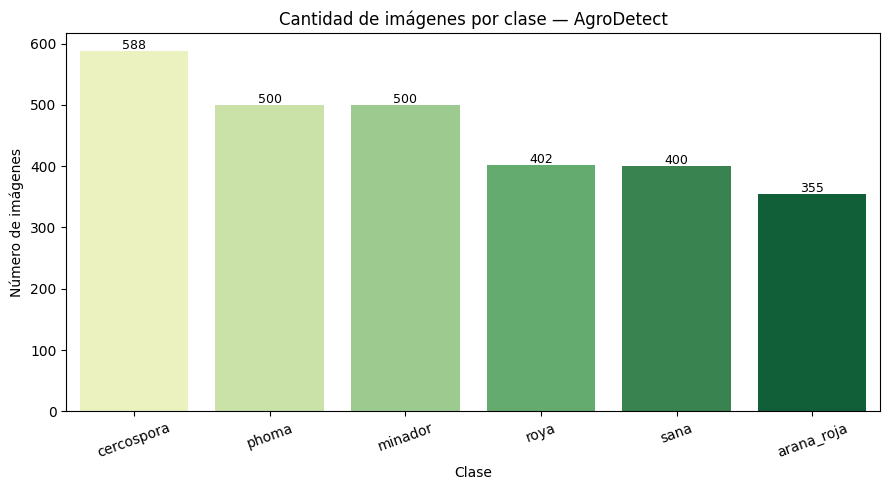

In [ ]:
plt.figure(figsize=(9, 5))
colores = sns.color_palette("YlGn", len(df_conteo))
sns.barplot(data=df_conteo, x="clase", y="num_imagenes", palette=colores)
plt.title("Cantidad de imágenes por clase — AgroDetect")
plt.xlabel("Clase")
plt.ylabel("Número de imágenes")
plt.xticks(rotation=20)
for i, v in enumerate(df_conteo["num_imagenes"]):
    plt.text(i, v + 3, str(v), ha='center', fontsize=9)
plt.tight_layout()
plt.show()

# Nota: si alguna clase tiene muchas menos imágenes que las demás, el desbalance
# se compensará más adelante con pesos de clase (class_weight) durante el entrenamiento.


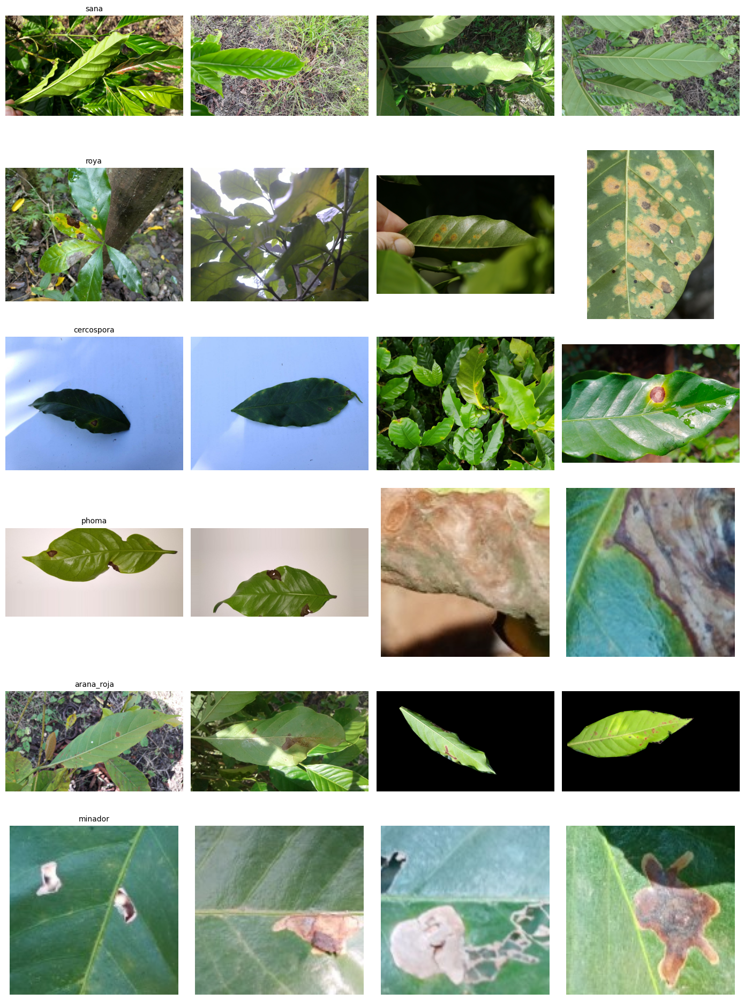

In [ ]:
# Mostramos ejemplos aleatorios de cada clase
fig, axes = plt.subplots(len(CLASES), 4, figsize=(14, 3.2 * len(CLASES)))
for i, clase in enumerate(CLASES):
    carpeta = os.path.join(DATA_ORG_DIR, clase)
    archivos = os.listdir(carpeta)
    muestra = random.sample(archivos, min(4, len(archivos)))
    for j, fname in enumerate(muestra):
        img = Image.open(os.path.join(carpeta, fname))
        axes[i, j].imshow(img)
        axes[i, j].axis('off')
        if j == 0:
            axes[i, j].set_ylabel(clase, fontsize=12)
        axes[i, j].set_title(clase if j == 0 else "", fontsize=10)
plt.tight_layout()
plt.show()


## 5. División en Train / Validation / Test

Dividimos el dataset de forma **estratificada** (misma proporción de clases en cada
conjunto) siguiendo un esquema **70% entrenamiento / 15% validación / 15% prueba**,
tal como se describe en la fase de *Evaluación* del anteproyecto (sección 4.1, paso 5).


In [ ]:
SPLIT_DIR = "/content/dataset_split"
if os.path.exists(SPLIT_DIR):
    shutil.rmtree(SPLIT_DIR)

TRAIN_RATIO, VAL_RATIO, TEST_RATIO = 0.70, 0.15, 0.15
assert abs(TRAIN_RATIO + VAL_RATIO + TEST_RATIO - 1.0) < 1e-9

for subset in ["train", "val", "test"]:
    for clase in CLASES:
        os.makedirs(os.path.join(SPLIT_DIR, subset, clase), exist_ok=True)

resumen_split = []
for clase in CLASES:
    carpeta = os.path.join(DATA_ORG_DIR, clase)
    archivos = os.listdir(carpeta)

    # 70% train, 30% restante -> luego partido en val/test (15%/15%)
    train_files, resto_files = train_test_split(
        archivos, train_size=TRAIN_RATIO, random_state=SEED
    )
    val_files, test_files = train_test_split(
        resto_files, train_size=VAL_RATIO / (VAL_RATIO + TEST_RATIO), random_state=SEED
    )

    for subset, files in [("train", train_files), ("val", val_files), ("test", test_files)]:
        for fname in files:
            shutil.copy2(
                os.path.join(carpeta, fname),
                os.path.join(SPLIT_DIR, subset, clase, fname)
            )

    resumen_split.append({
        "clase": clase, "train": len(train_files),
        "val": len(val_files), "test": len(test_files),
        "total": len(archivos)
    })

df_split = pd.DataFrame(resumen_split)
print(df_split)
print("\nTotales -> train:", df_split["train"].sum(),
      " val:", df_split["val"].sum(),
      " test:", df_split["test"].sum())


        clase  train  val  test  total
0        sana    280   60    60    400
1        roya    281   60    61    402
2  cercospora    411   88    89    588
3       phoma    350   75    75    500
4  arana_roja    248   53    54    355
5     minador    350   75    75    500

Totales -> train: 1920  val: 411  test: 414


### 5.1 Balanceo del conjunto de entrenamiento (generación de imágenes sintéticas)

La meta original del anteproyecto era contar con **~400 imágenes por clase**. Al revisar el
split real, algunas clases ya alcanzan o superan esa meta (p. ej. phoma, minador), pero otras
quedan por debajo — notablemente **cercospora** y sobre todo **araña_roja**, que es también la
clase con peor F1-score en la evaluación.

Para acercar todas las clases a la meta de 400, generamos imágenes sintéticas mediante
transformaciones aleatorias (volteo, rotación, zoom/recorte, brillo, contraste y saturación)
a partir de las imágenes reales **ya existentes en train**, hasta alcanzar la proporción
correspondiente de la meta (400 × 70% ≈ 280 imágenes por clase en train).

⚠️ **Importante — por qué solo se aplica a `train`:** si generáramos las imágenes sintéticas
*antes* de dividir en train/val/test, podría quedar una imagen real en el conjunto de prueba y
una copia sintética casi idéntica en el de entrenamiento (*data leakage*), lo que infla
artificialmente las métricas de validación/prueba. Por eso este balanceo se hace **después**
del split de la sección 5, y **solo sobre la carpeta de `train`**; `val` y `test` se mantienen
100% con imágenes reales para que la evaluación siga siendo honesta.

⚠️ **Lo que esto NO resuelve:** roya ya tenía ~400 imágenes en el dataset original y aun así
tuvo un F1 bajo (0.65); su confusión con sana y araña_roja en la matriz de confusión sugiere un
problema de **solapamiento visual entre clases**, no de cantidad de datos. Generar más copias
sintéticas de roya no va a arreglar eso — para mejorarlo haría falta revisar la calidad/
diversidad real de esas imágenes, o incluso replantear si alguna subclase de roya está mal
etiquetada.


**Antes de generar sintéticas: revisión visual de las imágenes reales.** Las imágenes sintéticas
se generan a partir de las imágenes reales que ya tienes — si alguna foto real está mal recortada,
tiene fondo muy distinto al resto (ej. tierra/hojarasca en vez de la hoja), o parece mal
etiquetada, el generador simplemente **multiplica ese mismo problema** varias veces. Vale la pena
revisar rápido antes de correr el balanceo, sobre todo en las clases con menos datos.


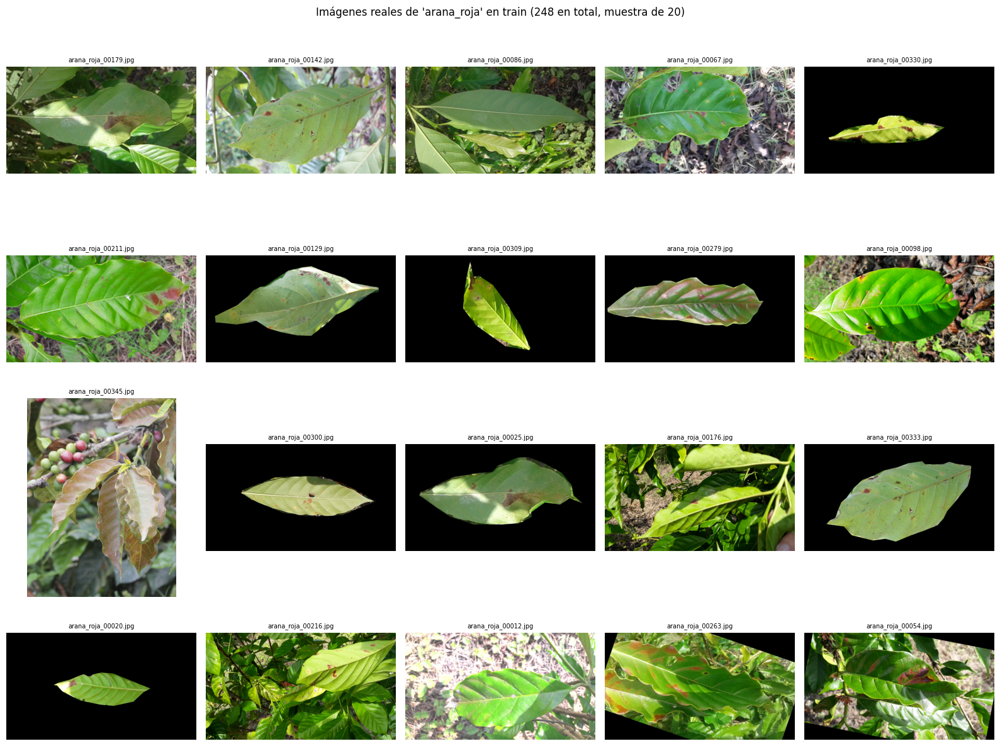

👀 Si ves alguna imagen claramente mala (fondo muy distinto, hoja no visible, borrosa,
   mal recortada), copia su nombre de archivo en ARCHIVOS_A_ELIMINAR en la siguiente celda.


In [ ]:
# Revisión visual rápida de imágenes reales de una clase (cambia CLASE_A_REVISAR)
CLASE_A_REVISAR = "arana_roja"

carpeta_revisar = os.path.join(SPLIT_DIR, "train", CLASE_A_REVISAR)
archivos_revisar = [f for f in os.listdir(carpeta_revisar) if "_sint_" not in f]
n_mostrar = min(20, len(archivos_revisar))
muestra = random.sample(archivos_revisar, n_mostrar)

cols = 5
filas = int(np.ceil(n_mostrar / cols))
fig, axes = plt.subplots(filas, cols, figsize=(3.2 * cols, 3.2 * filas))
axes = np.array(axes).reshape(-1)

for ax, fname in zip(axes, muestra):
    ax.imshow(Image.open(os.path.join(carpeta_revisar, fname)))
    ax.set_title(fname, fontsize=7)
    ax.axis("off")
for ax in axes[n_mostrar:]:
    ax.axis("off")

plt.suptitle(f"Imágenes reales de '{CLASE_A_REVISAR}' en train ({len(archivos_revisar)} en total, muestra de {n_mostrar})")
plt.tight_layout()
plt.show()

print("👀 Si ves alguna imagen claramente mala (fondo muy distinto, hoja no visible, borrosa,")
print("   mal recortada), copia su nombre de archivo en ARCHIVOS_A_ELIMINAR en la siguiente celda.")


In [ ]:
# Si identificaste imágenes reales de mala calidad en la celda anterior, ponlas aquí
# (nombre de archivo tal cual aparece en el título de cada imagen) y corre esta celda
# para eliminarlas del conjunto de entrenamiento antes de generar sintéticas.
ARCHIVOS_A_ELIMINAR = [
    # "arana_roja_00123.jpg",
]

for fname in ARCHIVOS_A_ELIMINAR:
    ruta = os.path.join(carpeta_revisar, fname)
    if os.path.exists(ruta):
        os.remove(ruta)
        print(f"🗑️  Eliminada: {fname}")
    else:
        print(f"⚠️  No encontrada (revisa el nombre): {fname}")

print(f"\nQuedan {len(os.listdir(carpeta_revisar))} imágenes en train/{CLASE_A_REVISAR}")



Quedan 248 imágenes en train/arana_roja


In [ ]:
import random
from PIL import ImageEnhance

TARGET_TOTAL_POR_CLASE = 400  # meta original del anteproyecto (imagenes reales + sinteticas)
TARGET_TRAIN_POR_CLASE = round(TARGET_TOTAL_POR_CLASE * TRAIN_RATIO)  # ~280 en train

print(f"Meta de imagenes en TRAIN por clase: {TARGET_TRAIN_POR_CLASE}")
print("(val y test NO se tocan: se mantienen 100% imagenes reales para una evaluacion honesta)\n")

def generar_imagen_aumentada(img):
    """Aplica una combinacion aleatoria de transformaciones a una imagen PIL (RGB).

    Nota: la rotacion con expand=False deja las esquinas "en blanco" (artefacto visible
    tipo triangulo). Para evitarlo, despues de rotar recortamos un margen que elimina esas
    esquinas y luego reescalamos de vuelta al tamaño original.
    """
    if random.random() < 0.5:
        img = img.transpose(Image.FLIP_LEFT_RIGHT)

    ancho, alto = img.size

    angulo = random.uniform(-15, 15)  # rango mas conservador que antes (era ±25)
    if abs(angulo) > 1:
        img = img.rotate(angulo, expand=False, resample=Image.BICUBIC)
        margen = 0.12  # recorta el 12% de cada borde para quitar las esquinas en blanco
        mx, my = int(ancho * margen), int(alto * margen)
        img = img.crop((mx, my, ancho - mx, alto - my)).resize((ancho, alto))

    zoom = random.uniform(0.88, 1.0)  # zoom un poco mas suave que antes (era 0.85-1.0)
    nx, ny = max(1, int(ancho * zoom)), max(1, int(alto * zoom))
    x0 = random.randint(0, ancho - nx)
    y0 = random.randint(0, alto - ny)
    img = img.crop((x0, y0, x0 + nx, y0 + ny)).resize((ancho, alto))

    img = ImageEnhance.Brightness(img).enhance(random.uniform(0.85, 1.15))
    img = ImageEnhance.Contrast(img).enhance(random.uniform(0.85, 1.15))
    img = ImageEnhance.Color(img).enhance(random.uniform(0.9, 1.1))
    return img

resumen_balanceo = []
for clase in CLASES:
    carpeta_train = os.path.join(SPLIT_DIR, "train", clase)
    archivos_reales = [f for f in os.listdir(carpeta_train)]
    n_actual = len(archivos_reales)
    n_faltantes = max(0, TARGET_TRAIN_POR_CLASE - n_actual)

    generadas = 0
    if n_faltantes > 0 and archivos_reales:
        for i in range(n_faltantes):
            origen_fname = random.choice(archivos_reales)
            with Image.open(os.path.join(carpeta_train, origen_fname)).convert("RGB") as img:
                img_aum = generar_imagen_aumentada(img)
            nuevo_nombre = f"{clase}_sint_{i:05d}.jpg"
            img_aum.save(os.path.join(carpeta_train, nuevo_nombre), quality=90)
            generadas += 1

    resumen_balanceo.append({
        "clase": clase, "reales_train": n_actual,
        "sinteticas_generadas": generadas,
        "total_train_final": n_actual + generadas,
    })
    print(f"{clase:12s}: {n_actual:4d} reales + {generadas:4d} sinteticas = {n_actual + generadas:4d} en train")

df_balanceo = pd.DataFrame(resumen_balanceo)
df_balanceo


Meta de imagenes en TRAIN por clase: 280
(val y test NO se tocan: se mantienen 100% imagenes reales para una evaluacion honesta)

sana        :  280 reales +    0 sinteticas =  280 en train
roya        :  281 reales +    0 sinteticas =  281 en train
cercospora  :  411 reales +    0 sinteticas =  411 en train
phoma       :  350 reales +    0 sinteticas =  350 en train
arana_roja  :  248 reales +   32 sinteticas =  280 en train
minador     :  350 reales +    0 sinteticas =  350 en train


,clase,reales_train,sinteticas_generadas,total_train_final
0,sana,280,0,280
1,roya,281,0,281
2,cercospora,411,0,411
3,phoma,350,0,350
4,arana_roja,248,32,280
5,minador,350,0,350


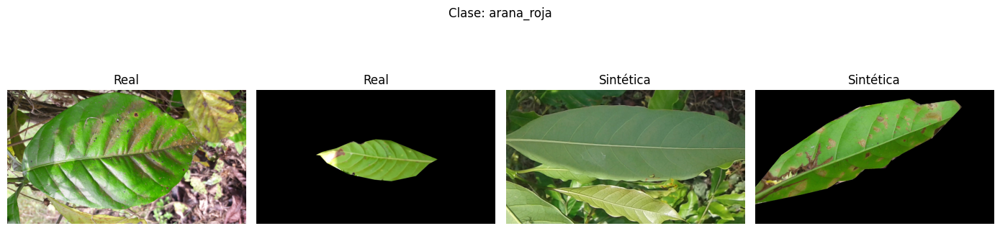

In [ ]:
# Verificacion visual rapida: comparamos una imagen real vs. una sintetica de la
# clase con mas imagenes generadas, para confirmar que el augmentation se ve razonable.
clase_revisar = df_balanceo.sort_values("sinteticas_generadas", ascending=False).iloc[0]["clase"]
carpeta = os.path.join(SPLIT_DIR, "train", clase_revisar)
reales = [f for f in os.listdir(carpeta) if "_sint_" not in f]
sinteticas = [f for f in os.listdir(carpeta) if "_sint_" in f]

fig, axes = plt.subplots(1, 4, figsize=(14, 4))
for ax, fname in zip(axes[:2], random.sample(reales, min(2, len(reales)))):
    ax.imshow(Image.open(os.path.join(carpeta, fname)))
    ax.set_title("Real")
    ax.axis("off")
for ax, fname in zip(axes[2:], random.sample(sinteticas, min(2, len(sinteticas)))):
    ax.imshow(Image.open(os.path.join(carpeta, fname)))
    ax.set_title("Sintética")
    ax.axis("off")
plt.suptitle(f"Clase: {clase_revisar}")
plt.tight_layout()
plt.show()


## 6. Preprocesamiento y *data augmentation*

Cargamos las imágenes con `image_dataset_from_directory` y aplicamos **aumento de datos**
(rotaciones, volteos horizontales y ajustes de brillo/contraste) al conjunto de entrenamiento,
como se especifica en la sección 4.1 del anteproyecto, para mejorar la robustez del modelo ante
distintas condiciones de campo (ángulo de la foto, iluminación, etc.).

La normalización final de los píxeles **no se aplica todavía aquí**: como en la sección 7 se
comparan tres arquitecturas distintas (MobileNetV2, EfficientNetB0 y ResNet50), y cada una
espera su propio rango de entrada, el `preprocess_input` correspondiente se aplica más adelante,
de forma independiente para cada modelo.


In [ ]:
IMG_SIZE = (224, 224)   # tamaño de entrada estándar de MobileNetV2
BATCH_SIZE = 32

train_ds_raw = tf.keras.utils.image_dataset_from_directory(
    os.path.join(SPLIT_DIR, "train"),
    labels="inferred",
    label_mode="categorical",
    class_names=CLASES,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=SEED,
)

val_ds_raw = tf.keras.utils.image_dataset_from_directory(
    os.path.join(SPLIT_DIR, "val"),
    labels="inferred",
    label_mode="categorical",
    class_names=CLASES,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=False,
)

test_ds_raw = tf.keras.utils.image_dataset_from_directory(
    os.path.join(SPLIT_DIR, "test"),
    labels="inferred",
    label_mode="categorical",
    class_names=CLASES,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=False,
)

NUM_CLASES = len(CLASES)
print("Clases (orden usado por el modelo):", train_ds_raw.class_names)


Found 1952 files belonging to 6 classes.
Found 411 files belonging to 6 classes.
Found 414 files belonging to 6 classes.
Clases (orden usado por el modelo): ['sana', 'roya', 'cercospora', 'phoma', 'arana_roja', 'minador']


In [ ]:
# Capa de aumento de datos: rotaciones, volteos, brillo/contraste + variabilidad
# de campo real (ruido, blur leve, saturación) para reducir la brecha entre
# el dataset de entrenamiento (mezcla estudio/campo) y fotos externas nuevas.
data_augmentation = keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.15),
    layers.RandomZoom(0.15),
    layers.RandomContrast(0.2),           # subido de 0.15 a 0.2, un poco más agresivo
    layers.RandomBrightness(0.2),         # subido de 0.15 a 0.2
    layers.RandomTranslation(0.1, 0.1),   # NUEVO: simula que la mancha no está centrada
    layers.GaussianNoise(0.02),           # NUEVO: simula ruido de cámara de celular
], name="data_augmentation")

def aplicar_augmentation(ds):
    """Aplica solo el aumento de datos (imagenes aun en escala 0-255)."""
    return ds.map(lambda x, y: (data_augmentation(x, training=True), y),
                  num_parallel_calls=tf.data.AUTOTUNE)

train_ds_aug = aplicar_augmentation(train_ds_raw)
val_ds_cache = val_ds_raw
test_ds_cache = test_ds_raw

def construir_pipeline(preprocess_fn):
    tr = (train_ds_aug
          .map(lambda x, y: (preprocess_fn(x), y), num_parallel_calls=tf.data.AUTOTUNE)
          .prefetch(tf.data.AUTOTUNE))
    va = (val_ds_cache
          .map(lambda x, y: (preprocess_fn(x), y), num_parallel_calls=tf.data.AUTOTUNE)
          .prefetch(tf.data.AUTOTUNE))
    te = (test_ds_cache
          .map(lambda x, y: (preprocess_fn(x), y), num_parallel_calls=tf.data.AUTOTUNE)
          .prefetch(tf.data.AUTOTUNE))
    return tr, va, te

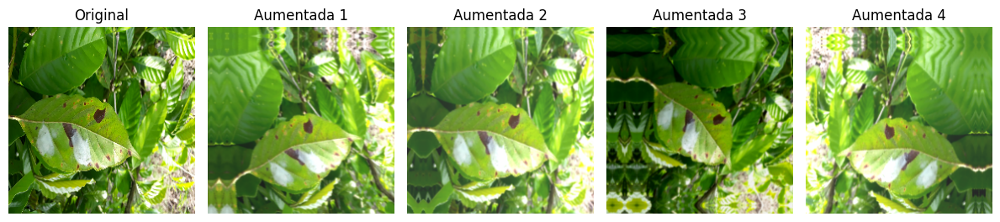

In [ ]:
# Visualizamos el efecto del data augmentation sobre una imagen de ejemplo
for images, labels in train_ds_raw.take(1):
    imagen_original = images[0].numpy().astype("uint8")
    break

plt.figure(figsize=(12, 4))
plt.subplot(1, 5, 1)
plt.imshow(imagen_original)
plt.title("Original")
plt.axis('off')

for i in range(4):
    aug_img = data_augmentation(tf.expand_dims(imagen_original, 0), training=True)
    plt.subplot(1, 5, i + 2)
    plt.imshow(aug_img[0].numpy().astype("uint8"))
    plt.title(f"Aumentada {i+1}")
    plt.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
# Pesos de clase, por si el dataset queda desbalanceado tras la extracción real
from sklearn.utils.class_weight import compute_class_weight

etiquetas_train = []
for clase_idx, clase in enumerate(CLASES):
    carpeta = os.path.join(SPLIT_DIR, "train", clase)
    etiquetas_train += [clase_idx] * len(os.listdir(carpeta))

pesos = compute_class_weight(
    class_weight="balanced",
    classes=np.arange(NUM_CLASES),
    y=etiquetas_train
)
class_weight = {i: w for i, w in enumerate(pesos)}
print("Pesos de clase (class_weight):")
for i, clase in enumerate(CLASES):
    print(f"  {clase:12s}: {class_weight[i]:.3f}")


Pesos de clase (class_weight):
  sana        : 1.162
  roya        : 1.158
  cercospora  : 0.792
  phoma       : 0.930
  arana_roja  : 1.162
  minador     : 0.930


## 7. Comparación de arquitecturas candidatas (MobileNetV2 vs. EfficientNetB0)

Se compararon previamente 3 arquitecturas (MobileNetV2, EfficientNetB0, ResNet50); ResNet50 se
descartó para el despliegue final por ser demasiado pesada (~25M de parámetros) para Streamlit
Community Cloud, aunque haya dado buen F1 en pruebas anteriores. Se deja fuera de esta
comparación para no invertir tiempo de entrenamiento en una arquitectura que de todas formas no
se va a desplegar.

Se comparan entonces **MobileNetV2** (la usada hasta ahora) y **EfficientNetB0** (~5.3M de
parámetros — sigue siendo liviana, pero con una arquitectura más moderna que suele mejorar la
exactitud sin aumentar mucho el costo), ambas bajo la misma estrategia de dos fases (cabeza
congelada → fine-tuning). Al final se selecciona la ganadora combinando desempeño (F1) y tamaño
del modelo, igual que en la comparación original.


In [ ]:
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input as mobilenet_preprocess
from tensorflow.keras.applications.efficientnet import preprocess_input as effnet_preprocess
import time

ARQUITECTURAS = {
    "MobileNetV2":    {"clase": MobileNetV2,    "preprocess": mobilenet_preprocess, "capas_descongelar": 40},
    "EfficientNetB0": {"clase": EfficientNetB0, "preprocess": effnet_preprocess,    "capas_descongelar": 30},
}


In [ ]:
def entrenar_arquitectura(nombre, config, epochs_fase1=8, epochs_fase2=5, pasos_por_epoca=None):
    """Construye, entrena (2 fases) y evalua una arquitectura candidata."""
    print(f"\n{'='*70}\nEntrenando arquitectura: {nombre}\n{'='*70}")

    tr_ds, va_ds, te_ds = construir_pipeline(config["preprocess"])

    base = config["clase"](input_shape=IMG_SIZE + (3,), include_top=False, weights="imagenet")
    base.trainable = False

    inputs = keras.Input(shape=IMG_SIZE + (3,))
    x = base(inputs, training=False)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dropout(0.3)(x)
    x = layers.Dense(128, activation="relu")(x)
    x = layers.Dropout(0.2)(x)
    outputs = layers.Dense(NUM_CLASES, activation="softmax")(x)
    modelo = keras.Model(inputs, outputs, name=f"AgroDetect_{nombre}")

    modelo.compile(
        optimizer=keras.optimizers.Adam(learning_rate=1e-3),
        loss="categorical_crossentropy",
        metrics=["accuracy", keras.metrics.Precision(name="precision"), keras.metrics.Recall(name="recall")]
    )

    cb_fase1 = [
        keras.callbacks.EarlyStopping(monitor="val_loss", patience=4, restore_best_weights=True),
        keras.callbacks.ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=2, min_lr=1e-6),
    ]

    inicio = time.time()
    print("--- Fase 1: cabeza de clasificacion (base congelada) ---")
    hist1 = modelo.fit(tr_ds, validation_data=va_ds, epochs=epochs_fase1,
                        steps_per_epoch=pasos_por_epoca,
                        class_weight=class_weight, callbacks=cb_fase1, verbose=1)

    base.trainable = True
    fine_tune_at = len(base.layers) - config["capas_descongelar"]
    for layer in base.layers[:fine_tune_at]:
        layer.trainable = False

    modelo.compile(
        optimizer=keras.optimizers.Adam(learning_rate=1e-5),
        loss="categorical_crossentropy",
        metrics=["accuracy", keras.metrics.Precision(name="precision"), keras.metrics.Recall(name="recall")]
    )

    cb_fase2 = [
        keras.callbacks.EarlyStopping(monitor="val_loss", patience=4, restore_best_weights=True),
        keras.callbacks.ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=2, min_lr=1e-7),
    ]

    print(f"--- Fase 2: fine-tuning de las ultimas {config['capas_descongelar']} capas ---")
    hist2 = modelo.fit(tr_ds, validation_data=va_ds, epochs=epochs_fase1 + epochs_fase2,
                        initial_epoch=hist1.epoch[-1] + 1, steps_per_epoch=pasos_por_epoca,
                        class_weight=class_weight, callbacks=cb_fase2, verbose=1)
    tiempo_total = time.time() - inicio

    test_loss, test_acc, test_prec, test_rec = modelo.evaluate(te_ds, verbose=0)
    test_f1 = 2 * test_prec * test_rec / (test_prec + test_rec + 1e-9)

    print(f"\n{nombre} -> accuracy: {test_acc:.4f} | precision: {test_prec:.4f} | "
          f"recall: {test_rec:.4f} | F1: {test_f1:.4f} | tiempo: {tiempo_total/60:.1f} min")

    return {
        "nombre": nombre, "model": modelo,
        "history_fase1": hist1, "history_fase2": hist2,
        "train_ds": tr_ds, "val_ds": va_ds, "test_ds": te_ds,
        "preprocess_fn": config["preprocess"],
        "test_loss": test_loss, "test_acc": test_acc,
        "test_prec": test_prec, "test_rec": test_rec, "test_f1": test_f1,
        "num_parametros": modelo.count_params(), "tiempo_seg": tiempo_total,
    }


### Entrenamiento de las 2 arquitecturas

> ⏱️ Con dataset grande, activa `MODO_RAPIDO = True` para una primera comparación rápida
> (limita los batches por época). Luego, para el entrenamiento final de la ganadora, vuelve a
> `False` para usar el dataset completo.


In [ ]:
MODO_RAPIDO = False
PASOS_RAPIDOS = 40

resultados = {}
for nombre, config in ARQUITECTURAS.items():
    resultados[nombre] = entrenar_arquitectura(
        nombre, config,
        pasos_por_epoca=PASOS_RAPIDOS if MODO_RAPIDO else None,
    )

print("\n✅ Entrenamiento de las 2 arquitecturas completado.")



Entrenando arquitectura: MobileNetV2
9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
--- Fase 1: cabeza de clasificacion (base congelada) ---
Epoch 1/8
61/61 ━━━━━━━━━━━━━━━━━━━━ 143s 2s/step - accuracy: 0.6245 - loss: 1.0339 - precision: 0.7607 - recall: 0.5082 - val_accuracy: 0.8516 - val_loss: 0.4686 - val_precision: 0.9267 - val_recall: 0.7689 - learning_rate: 0.0010
Epoch 2/8
61/61 ━━━━━━━━━━━━━━━━━━━━ 142s 2s/step - accuracy: 0.7833 - loss: 0.6236 - precision: 0.8435 - recall: 0.7208 - val_accuracy: 0.8735 - val_loss: 0.3805 - val_precision: 0.9208 - val_recall: 0.8200 - learning_rate: 0.0010
Epoch 3/8
61/61 ━━━━━━━━━━━━━━━━━━━━ 135s 2s/step - accuracy: 0.8304 - loss: 0.5204 - precision: 0.8793 - recall: 0.7761 - val_accuracy: 0.9002 - val_loss: 0.3325 - val_precision: 0.9299 - val_recall: 0.8394 - learning_rate: 0.0010
Epoch 4/8
61/61 ━━━━━━━━━━━━━━━━━━━━ 132s 2s/step - accuracy: 0.8407 - loss: 0.4798 - precision: 0.8754 - recall: 0.7992 - val_accuracy: 0.9124 - val_loss: 0.30

### Tabla comparativa y selección de la mejor arquitectura

📊 Comparación de arquitecturas evaluadas (ordenadas por F1-score):

  Arquitectura  Exactitud (test)  Precision (test)  Sensibilidad (test)  F1-score (test)  Parametros (millones)  Tiempo entrenamiento (min)
   MobileNetV2          0.862319          0.881612             0.845411         0.863132                   2.42                        34.1
EfficientNetB0          0.835749          0.901685             0.775362         0.833766                   4.21                        47.8


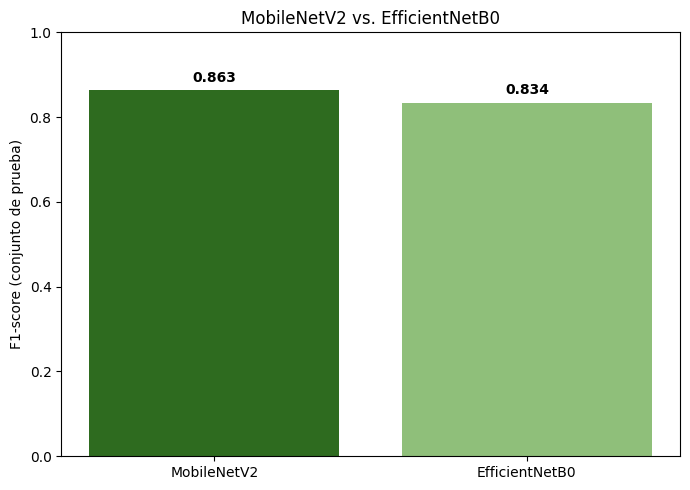

In [ ]:
tabla_comparativa = pd.DataFrame([
    {
        "Arquitectura": r["nombre"],
        "Exactitud (test)": r["test_acc"],
        "Precision (test)": r["test_prec"],
        "Sensibilidad (test)": r["test_rec"],
        "F1-score (test)": r["test_f1"],
        "Parametros (millones)": round(r["num_parametros"] / 1e6, 2),
        "Tiempo entrenamiento (min)": round(r["tiempo_seg"] / 60, 1),
    }
    for r in resultados.values()
]).sort_values("F1-score (test)", ascending=False).reset_index(drop=True)

print("📊 Comparación de arquitecturas evaluadas (ordenadas por F1-score):\n")
print(tabla_comparativa.to_string(index=False))

plt.figure(figsize=(7, 5))
plt.bar(tabla_comparativa["Arquitectura"], tabla_comparativa["F1-score (test)"], color=["#2e6b1f", "#8fbf7a"])
plt.ylabel("F1-score (conjunto de prueba)")
plt.title("MobileNetV2 vs. EfficientNetB0")
plt.ylim(0, 1)
for i, v in enumerate(tabla_comparativa["F1-score (test)"]):
    plt.text(i, v + 0.02, f"{v:.3f}", ha="center", fontweight="bold")
plt.tight_layout()
plt.show()


In [ ]:
PRIORIZAR_DESPLIEGUE = True  # False = elegir solo por F1-score, sin importar el tamaño

tabla_comparativa["F1_norm"] = tabla_comparativa["F1-score (test)"] / tabla_comparativa["F1-score (test)"].max()
tabla_comparativa["Tamano_norm"] = tabla_comparativa["Parametros (millones)"].min() / tabla_comparativa["Parametros (millones)"]
tabla_comparativa["Puntaje_despliegue"] = 0.7 * tabla_comparativa["F1_norm"] + 0.3 * tabla_comparativa["Tamano_norm"]

criterio_orden = "Puntaje_despliegue" if PRIORIZAR_DESPLIEGUE else "F1-score (test)"
tabla_comparativa = tabla_comparativa.sort_values(criterio_orden, ascending=False).reset_index(drop=True)

print("📊 Tabla comparativa (ordenada por", criterio_orden, "):\n")
print(tabla_comparativa[["Arquitectura", "F1-score (test)", "Parametros (millones)", "Puntaje_despliegue"]].to_string(index=False))

mejor_nombre = tabla_comparativa.iloc[0]["Arquitectura"]
print(f"\n🏆 Arquitectura seleccionada para el despliegue: {mejor_nombre}")

mejor = resultados[mejor_nombre]
model = mejor["model"]
history_fase1 = mejor["history_fase1"]
history_fase2 = mejor["history_fase2"]
train_ds = mejor["train_ds"]
val_ds = mejor["val_ds"]
test_ds = mejor["test_ds"]
preprocess_input = mejor["preprocess_fn"]

# Extraemos el submodelo base (necesario para el Grad-CAM de la seccion 9.2, sin importar
# cual arquitectura haya ganado)
base_model = next(l for l in model.layers if hasattr(l, "layers") and len(l.layers) > 10)

test_acc, test_prec, test_rec = mejor["test_acc"], mejor["test_prec"], mejor["test_rec"]


📊 Tabla comparativa (ordenada por Puntaje_despliegue ):

  Arquitectura  F1-score (test)  Parametros (millones)  Puntaje_despliegue
   MobileNetV2         0.863132                   2.42            1.000000
EfficientNetB0         0.833766                   4.21            0.848631

🏆 Arquitectura seleccionada para el despliegue: MobileNetV2


## 8. Curvas de entrenamiento del modelo seleccionado

Graficamos la exactitud y la pérdida por época del modelo ganador (fases 1 y 2 combinadas),
para verificar que no hubo sobreajuste evidente antes de pasar a la evaluación formal.


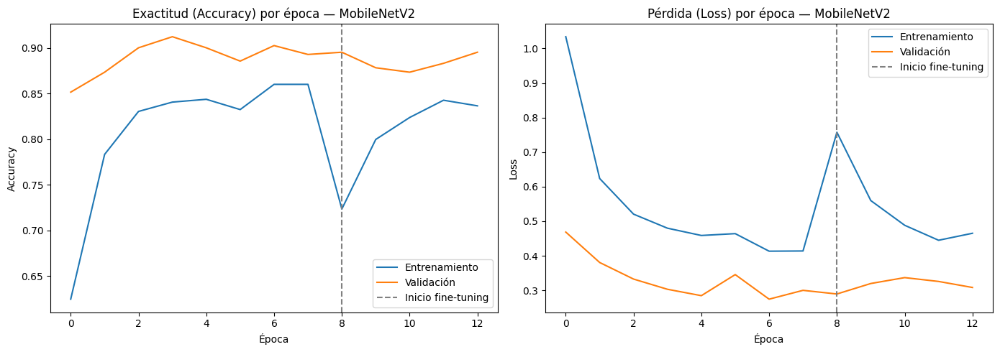

In [ ]:
# Combinamos el historial de ambas fases del modelo ganador para graficar el entrenamiento completo
def combinar_historiales(h1, h2):
    combinado = {}
    for key in h1.history:
        combinado[key] = h1.history[key] + h2.history.get(key, [])
    return combinado

historial = combinar_historiales(history_fase1, history_fase2)
epoca_finetune = len(history_fase1.epoch)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].plot(historial["accuracy"], label="Entrenamiento")
axes[0].plot(historial["val_accuracy"], label="Validación")
axes[0].axvline(epoca_finetune, color="gray", linestyle="--", label="Inicio fine-tuning")
axes[0].set_title(f"Exactitud (Accuracy) por época — {mejor_nombre}")
axes[0].set_xlabel("Época")
axes[0].set_ylabel("Accuracy")
axes[0].legend()

axes[1].plot(historial["loss"], label="Entrenamiento")
axes[1].plot(historial["val_loss"], label="Validación")
axes[1].axvline(epoca_finetune, color="gray", linestyle="--", label="Inicio fine-tuning")
axes[1].set_title(f"Pérdida (Loss) por época — {mejor_nombre}")
axes[1].set_xlabel("Época")
axes[1].set_ylabel("Loss")
axes[1].legend()

plt.tight_layout()
plt.show()


## 9. Evaluación del modelo seleccionado

Evaluamos el modelo ganador (la arquitectura elegida como mejor en la sección 7) sobre el
**conjunto de prueba** (test), que nunca vio durante el entrenamiento, usando las métricas
estándar mencionadas en el objetivo específico del anteproyecto: **exactitud, precisión,
sensibilidad (recall) y F1-score**.


In [ ]:
test_loss, test_acc, test_prec, test_rec = model.evaluate(test_ds)
print(f"\n📊 Resultados sobre el conjunto de PRUEBA:")
print(f"  Exactitud (accuracy):  {test_acc:.4f}")
print(f"  Precisión (precision): {test_prec:.4f}")
print(f"  Sensibilidad (recall): {test_rec:.4f}")
print(f"  Pérdida (loss):        {test_loss:.4f}")


13/13 ━━━━━━━━━━━━━━━━━━━━ 18s 1s/step - accuracy: 0.8623 - loss: 0.3417 - precision: 0.8816 - recall: 0.8454

📊 Resultados sobre el conjunto de PRUEBA:
  Exactitud (accuracy):  0.8623
  Precisión (precision): 0.8816
  Sensibilidad (recall): 0.8454
  Pérdida (loss):        0.3417


In [ ]:
# Predicciones sobre el conjunto de prueba (probabilidades por clase)
y_true = []
y_probs = []

for images, labels in test_ds:
    preds = model.predict(images, verbose=0)
    y_probs.append(preds)
    y_true.append(labels.numpy())

y_probs = np.concatenate(y_probs, axis=0)
y_true = np.concatenate(y_true, axis=0)

y_true_idx = np.argmax(y_true, axis=1)
y_pred_idx = np.argmax(y_probs, axis=1)
confianza_pred = np.max(y_probs, axis=1)   # probabilidad de la clase predicha (para umbrales, sección 10)

print("Predicciones generadas para", len(y_true_idx), "imágenes de prueba")


Predicciones generadas para 414 imágenes de prueba


In [ ]:
print("📋 Reporte de clasificación (test):\n")
print(classification_report(y_true_idx, y_pred_idx, target_names=CLASES, digits=3))


📋 Reporte de clasificación (test):

              precision    recall  f1-score   support

        sana      0.797     0.983     0.881        60
        roya      0.860     0.705     0.775        61
  cercospora      0.817     0.955     0.881        89
       phoma      0.919     0.907     0.913        75
  arana_roja      0.778     0.648     0.707        54
     minador      1.000     0.893     0.944        75

    accuracy                          0.862       414
   macro avg      0.862     0.849     0.850       414
weighted avg      0.867     0.862     0.860       414



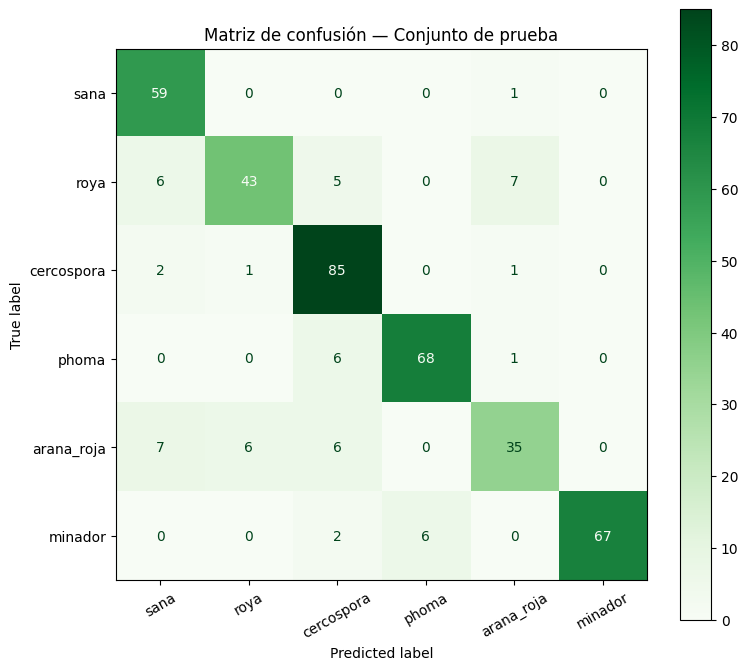

In [ ]:
cm = confusion_matrix(y_true_idx, y_pred_idx)
fig, ax = plt.subplots(figsize=(8, 7))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=CLASES)
disp.plot(ax=ax, cmap="Greens", xticks_rotation=30, colorbar=True)
plt.title("Matriz de confusión — Conjunto de prueba")
plt.tight_layout()
plt.show()


### 9.1 Diagnóstico visual: revisión manual de errores en araña_roja

Araña_roja ha sido la clase con peor desempeño en las 4 corridas realizadas, sin importar la
arquitectura ni el balanceo del dataset. Antes de seguir ajustando el modelo, revisamos a ojo
las imágenes reales que el modelo confunde, para distinguir si el problema es del **modelo**
(no logra aprender el patrón) o del **dato** (imágenes ambiguas, mal recortadas, o síntomas muy
similares a otra clase en una etapa temprana).


In [ ]:
# El orden de test_ds_raw.file_paths coincide con y_true_idx / y_pred_idx porque
# test_ds_raw se creo con shuffle=False y nunca se reordena en el pipeline.
archivos_test = test_ds_raw.file_paths

idx_arana = CLASES.index("arana_roja")
es_arana_real = (y_true_idx == idx_arana)
mal_clasificadas = es_arana_real & (y_pred_idx != idx_arana)
bien_clasificadas = es_arana_real & (y_pred_idx == idx_arana)

indices_mal = np.where(mal_clasificadas)[0]
indices_bien = np.where(bien_clasificadas)[0]

print(f"araña_roja en test: {es_arana_real.sum()} imágenes")
print(f"  -> correctas:   {len(indices_bien)}")
print(f"  -> incorrectas: {len(indices_mal)}")


araña_roja en test: 54 imágenes
  -> correctas:   35
  -> incorrectas: 19


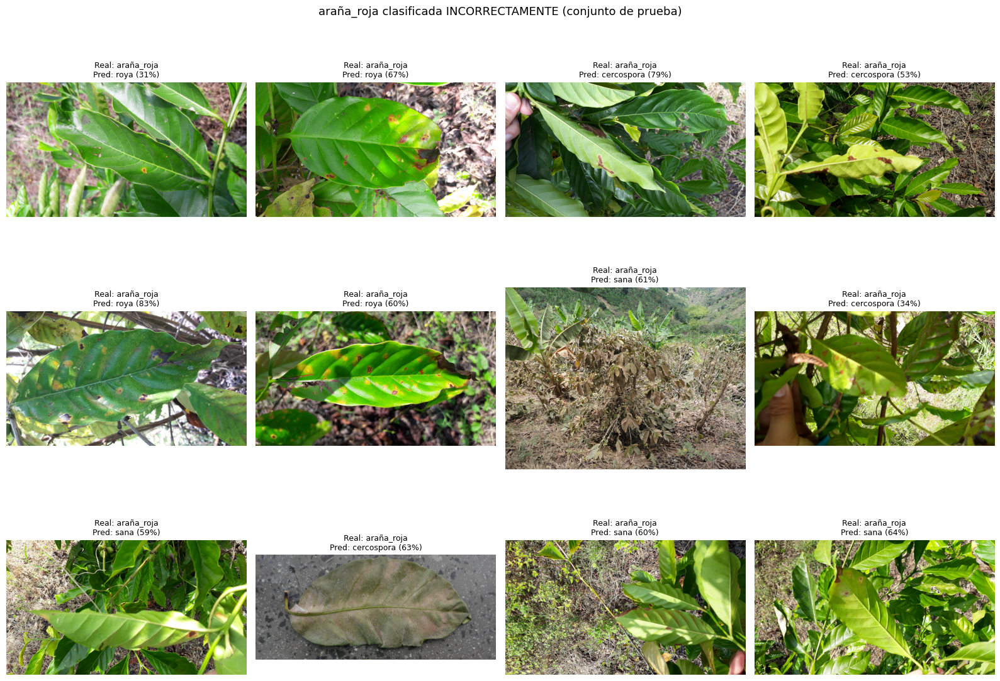

In [ ]:
# Mostramos las imagenes MAL clasificadas (araña_roja real, predicha como otra cosa)
n_mostrar = min(12, len(indices_mal))
cols = 4
filas = max(1, int(np.ceil(n_mostrar / cols)))
fig, axes = plt.subplots(filas, cols, figsize=(4 * cols, 4 * filas))
axes = np.array(axes).reshape(-1)

for ax, idx in zip(axes, indices_mal[:n_mostrar]):
    img = Image.open(archivos_test[idx])
    ax.imshow(img)
    ax.set_title(f"Real: araña_roja\nPred: {CLASES[y_pred_idx[idx]]} ({confianza_pred[idx]:.0%})", fontsize=9)
    ax.axis("off")
for ax in axes[n_mostrar:]:
    ax.axis("off")

plt.suptitle("araña_roja clasificada INCORRECTAMENTE (conjunto de prueba)", fontsize=13)
plt.tight_layout()
plt.show()


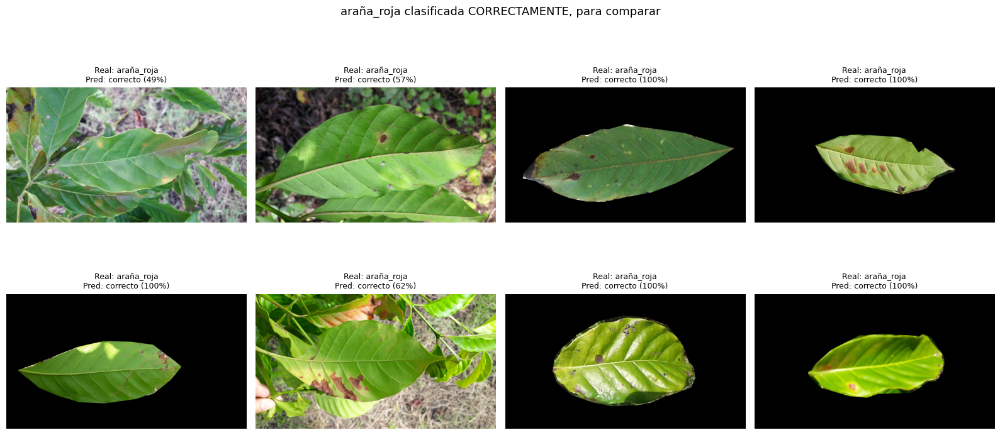

👀 Revisa: ¿las mal clasificadas se ven genuinamente distintas/ambiguas respecto a las
   bien clasificadas? ¿hay fotos borrosas, mal recortadas, con varias hojas, u otro
   problema de calidad? Eso orienta si conviene limpiar el dataset o revisar etiquetas.


In [ ]:
# Para comparar, mostramos tambien algunas BIEN clasificadas de araña_roja
n_mostrar_ok = min(8, len(indices_bien))
cols = 4
filas = max(1, int(np.ceil(n_mostrar_ok / cols)))
fig, axes = plt.subplots(filas, cols, figsize=(4 * cols, 4 * filas))
axes = np.array(axes).reshape(-1)

for ax, idx in zip(axes, indices_bien[:n_mostrar_ok]):
    img = Image.open(archivos_test[idx])
    ax.imshow(img)
    ax.set_title(f"Real: araña_roja\nPred: correcto ({confianza_pred[idx]:.0%})", fontsize=9)
    ax.axis("off")
for ax in axes[n_mostrar_ok:]:
    ax.axis("off")

plt.suptitle("araña_roja clasificada CORRECTAMENTE, para comparar", fontsize=13)
plt.tight_layout()
plt.show()

print("👀 Revisa: ¿las mal clasificadas se ven genuinamente distintas/ambiguas respecto a las")
print("   bien clasificadas? ¿hay fotos borrosas, mal recortadas, con varias hojas, u otro")
print("   problema de calidad? Eso orienta si conviene limpiar el dataset o revisar etiquetas.")


In [ ]:
# Precisión, sensibilidad y F1-score por clase, en tabla, para incluir en el informe
precision, recall, f1, soporte = precision_recall_fscore_support(y_true_idx, y_pred_idx, labels=range(NUM_CLASES))
df_metricas = pd.DataFrame({
    "clase": CLASES,
    "precision": precision,
    "recall (sensibilidad)": recall,
    "f1-score": f1,
    "soporte (n° imágenes)": soporte,
})
df_metricas.loc["promedio"] = ["—", precision.mean(), recall.mean(), f1.mean(), soporte.sum()]
df_metricas


,clase,precision,recall (sensibilidad),f1-score,soporte (n° imágenes)
0,sana,0.797297,0.983333,0.880597,60
1,roya,0.860000,0.704918,0.774775,61
2,cercospora,0.817308,0.955056,0.880829,89
3,phoma,0.918919,0.906667,0.912752,75
4,arana_roja,0.777778,0.648148,0.707071,54
5,minador,1.000000,0.893333,0.943662,75
promedio,—,0.861884,0.848576,0.849948,414


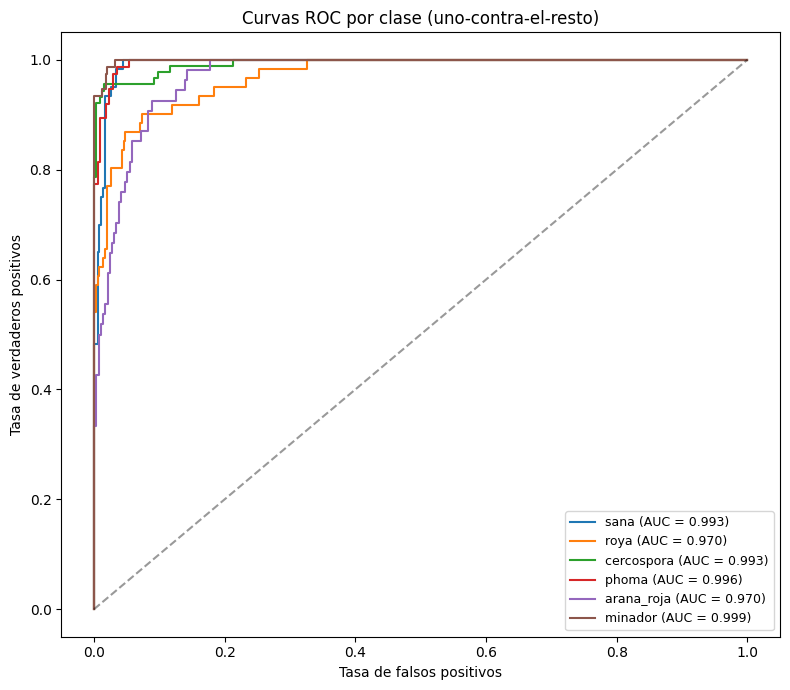

In [ ]:
# Curvas ROC y AUC por clase (útil para justificar el umbral de decisión de la sección 10)
y_true_bin = label_binarize(y_true_idx, classes=range(NUM_CLASES))

plt.figure(figsize=(8, 7))
for i, clase in enumerate(CLASES):
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_probs[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f"{clase} (AUC = {roc_auc:.3f})")

plt.plot([0, 1], [0, 1], "k--", alpha=0.4)
plt.xlabel("Tasa de falsos positivos")
plt.ylabel("Tasa de verdaderos positivos")
plt.title("Curvas ROC por clase (uno-contra-el-resto)")
plt.legend(loc="lower right", fontsize=9)
plt.tight_layout()
plt.show()


### 9.2 Mapa de calor (Grad-CAM): qué está mirando el modelo

El reporte de clasificación se ve bien en el conjunto de prueba, pero si al probar con fotos
nuevas (tomadas por ustedes, fuera de este dataset) el modelo se equivoca más de lo esperado,
lo más probable **no es que el modelo esté "mal entrenado"**, sino que existe una diferencia
entre las condiciones del dataset y las condiciones reales de uso (fondo, iluminación, encuadre,
cámara). Esto se llama *domain gap* o brecha de dominio, y es el problema más común en visión
por computador aplicada a agricultura con datasets de internet.

**Grad-CAM** ayuda a diagnosticar esto: genera un mapa de calor que muestra qué región de la
imagen influyó más en la predicción del modelo. Si al ver el mapa de calor la "atención" del
modelo cae sobre la **hoja y las lesiones/manchas** — bien, está aprendiendo lo correcto. Pero si
cae sobre el **fondo**, los **bordes de la foto**, o zonas sin relación con la enfermedad, es una
señal de que el modelo aprendió un atajo (por ejemplo, "las fotos de roya en este dataset tienen
fondo blanco") en vez del patrón real de la enfermedad — y eso explicaría por qué falla con fotos
nuevas aunque el test se vea bien.


In [ ]:
import matplotlib.cm as cm

def obtener_mapa_gradcam(img_array_preprocesada, indice_clase=None):
    """Devuelve un mapa de calor (H x W, valores 0-1) para una imagen ya preprocesada
    (con preprocess_input aplicado) y con forma (1, alto, ancho, 3).

    Nota tecnica: como base_model se construyo con include_top=False, su salida YA ES
    el mapa de caracteristicas (ultima capa convolucional) que necesita Grad-CAM. En vez
    de armar un keras.Model nuevo que mezcle la salida interna de base_model con la salida
    final (lo cual falla en Keras 3 para modelos anidados), reconstruimos el resto del
    forward pass "a mano" dentro del GradientTape, capa por capa.
    """
    with tf.GradientTape() as tape:
        salida_conv = base_model(img_array_preprocesada, training=False)
        tape.watch(salida_conv)

        x = salida_conv
        for layer in model.layers:
            if layer is base_model or isinstance(layer, keras.layers.InputLayer):
                continue
            x = layer(x, training=False)
        predicciones = x

        if indice_clase is None:
            indice_clase = tf.argmax(predicciones[0])
        canal_clase = predicciones[:, indice_clase]

    gradientes = tape.gradient(canal_clase, salida_conv)
    pesos = tf.reduce_mean(gradientes, axis=(0, 1, 2))
    mapa_calor = salida_conv[0] @ pesos[..., tf.newaxis]
    mapa_calor = tf.squeeze(mapa_calor)
    mapa_calor = tf.maximum(mapa_calor, 0) / (tf.math.reduce_max(mapa_calor) + 1e-8)
    return mapa_calor.numpy(), int(indice_clase)

def superponer_gradcam(imagen_pil, mapa_calor, alpha=0.45):
    """Superpone el mapa de calor (jet) sobre la imagen original."""
    mapa_resized = np.array(Image.fromarray(np.uint8(255 * mapa_calor)).resize(imagen_pil.size))
    mapa_color = cm.get_cmap("jet")(mapa_resized / 255.0)[:, :, :3]
    mapa_color = Image.fromarray(np.uint8(mapa_color * 255))
    return Image.blend(imagen_pil.convert("RGB"), mapa_color, alpha)


/tmp/ipykernel_2905/2194370320.py:38: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  mapa_color = cm.get_cmap("jet")(mapa_resized / 255.0)[:, :, :3]


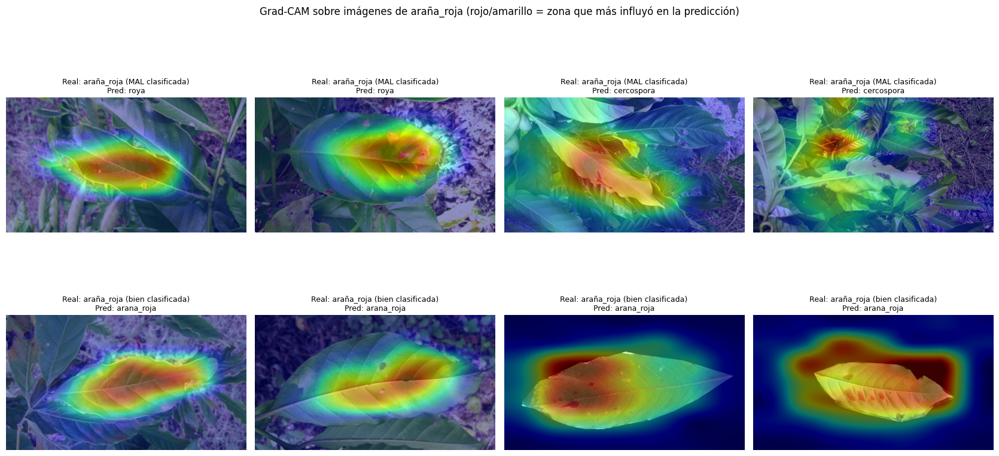

👀 Revisa: en las MAL clasificadas, ¿el calor cae sobre manchas/textura de la hoja, o se
   dispersa hacia el fondo/bordes? Eso indica si el modelo esta aprendiendo el sintoma real
   o un atajo del dataset (fondo, iluminacion, recorte).


In [ ]:
# Aplicamos Grad-CAM a una mezcla de imagenes: algunas mal clasificadas (de la seccion 9.1)
# y algunas bien clasificadas, para comparar donde "mira" el modelo en cada caso.
idx_muestra = list(indices_mal[:4]) + list(indices_bien[:4])
etiquetas_muestra = (["MAL clasificada"] * min(4, len(indices_mal))
                      + ["bien clasificada"] * min(4, len(indices_bien)))

n = len(idx_muestra)
cols = 4
filas = int(np.ceil(n / cols))
fig, axes = plt.subplots(filas, cols, figsize=(4.2 * cols, 4.5 * filas))
axes = np.array(axes).reshape(-1)

for ax, idx, etiqueta in zip(axes, idx_muestra, etiquetas_muestra):
    img_pil = Image.open(archivos_test[idx]).convert("RGB")
    x = tf.image.resize(np.array(img_pil), IMG_SIZE)
    x = preprocess_input(tf.expand_dims(x, 0))

    mapa_calor, clase_predicha_idx = obtener_mapa_gradcam(x)
    superpuesta = superponer_gradcam(img_pil, mapa_calor)

    ax.imshow(superpuesta)
    ax.set_title(f"Real: araña_roja ({etiqueta})\nPred: {CLASES[y_pred_idx[idx]]}", fontsize=9)
    ax.axis("off")

for ax in axes[n:]:
    ax.axis("off")

plt.suptitle("Grad-CAM sobre imágenes de araña_roja (rojo/amarillo = zona que más influyó en la predicción)", fontsize=12)
plt.tight_layout()
plt.show()

print("👀 Revisa: en las MAL clasificadas, ¿el calor cae sobre manchas/textura de la hoja, o se")
print("   dispersa hacia el fondo/bordes? Eso indica si el modelo esta aprendiendo el sintoma real")
print("   o un atajo del dataset (fondo, iluminacion, recorte).")


### Grad-CAM para cercospora

Cercospora es ahora la clase con más falsos positivos (precisión ≈ 0.65: el modelo dice
"cercospora" cuando en realidad es otra cosa). Repetimos el mismo análisis para ver si hay un
patrón visual que explique esa confusión.


cercospora en test: 89 imágenes -> 85 correctas, 4 incorrectas


/tmp/ipykernel_2905/2194370320.py:38: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  mapa_color = cm.get_cmap("jet")(mapa_resized / 255.0)[:, :, :3]


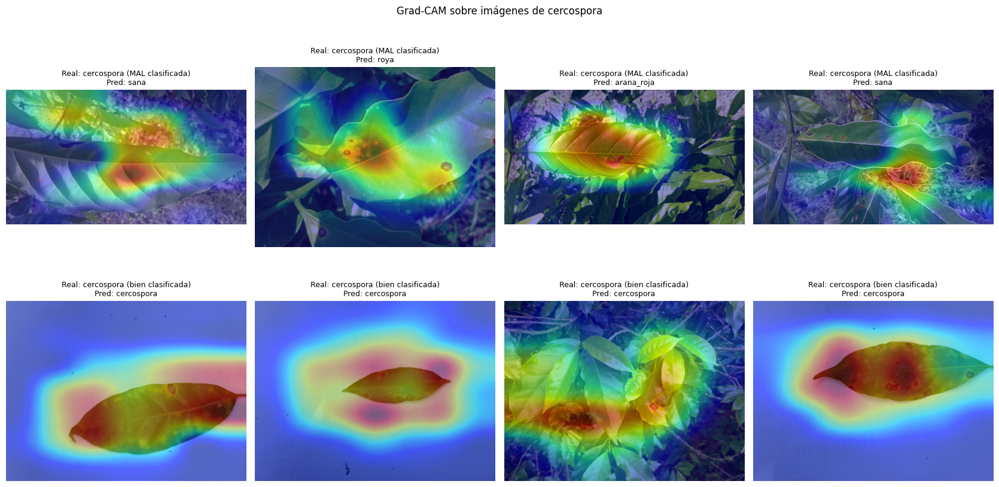

In [ ]:
# Grad-CAM para cercospora: mezcla de mal y bien clasificadas
idx_cercospora = CLASES.index("cercospora")
es_cercospora_real = (y_true_idx == idx_cercospora)
mal_clasificadas_cerc = es_cercospora_real & (y_pred_idx != idx_cercospora)
bien_clasificadas_cerc = es_cercospora_real & (y_pred_idx == idx_cercospora)

indices_mal_cerc = np.where(mal_clasificadas_cerc)[0]
indices_bien_cerc = np.where(bien_clasificadas_cerc)[0]
print(f"cercospora en test: {es_cercospora_real.sum()} imágenes -> "
      f"{len(indices_bien_cerc)} correctas, {len(indices_mal_cerc)} incorrectas")

idx_muestra_cerc = list(indices_mal_cerc[:4]) + list(indices_bien_cerc[:4])
etiquetas_muestra_cerc = (["MAL clasificada"] * min(4, len(indices_mal_cerc))
                           + ["bien clasificada"] * min(4, len(indices_bien_cerc)))

n = len(idx_muestra_cerc)
cols = 4
filas = int(np.ceil(n / cols))
fig, axes = plt.subplots(filas, cols, figsize=(4.2 * cols, 4.5 * filas))
axes = np.array(axes).reshape(-1)

for ax, idx, etiqueta in zip(axes, idx_muestra_cerc, etiquetas_muestra_cerc):
    img_pil = Image.open(archivos_test[idx]).convert("RGB")
    x = tf.image.resize(np.array(img_pil), IMG_SIZE)
    x = preprocess_input(tf.expand_dims(x, 0))

    mapa_calor, _ = obtener_mapa_gradcam(x)
    superpuesta = superponer_gradcam(img_pil, mapa_calor)

    ax.imshow(superpuesta)
    ax.set_title(f"Real: cercospora ({etiqueta})\nPred: {CLASES[y_pred_idx[idx]]}", fontsize=9)
    ax.axis("off")
for ax in axes[n:]:
    ax.axis("off")

plt.suptitle("Grad-CAM sobre imágenes de cercospora", fontsize=12)
plt.tight_layout()
plt.show()


**Para probar con una foto tuya (fuera del dataset):** usa la función `diagnosticar_desde_archivo`
de la sección 11 con una foto real tomada en campo, y compara la predicción/confianza contra lo
que ves con Grad-CAM aquí. Si el modelo falla en fotos reales pero el mapa de calor sí se enfoca
en la hoja, probablemente sea un tema de preprocesamiento en `app.py` (revisar que uses el mismo
`preprocess_input` de MobileNetV2, el mismo tamaño `IMG_SIZE`, y el mismo orden de canales RGB
que aquí). Si el mapa de calor se enfoca en el fondo, es un tema del dataset (falta diversidad de
fondos/condiciones reales en las imágenes de entrenamiento).


### 9.3 Ronda de refinamiento enfocada (cercospora y araña_roja)

El modelo ganador (la arquitectura elegida en la sección 7, guardada en `mejor_nombre`) tiene
un desempeño global sólido (F1 macro ≈ 0.86), pero **cercospora** y **araña_roja** siguen siendo
las clases más débiles, y el Grad-CAM mostró un patrón consistente: el modelo confunde estas
clases cuando el daño en la hoja es puntual/localizado en vez de difuso.

En vez de reentrenar todo desde cero, aplicamos una **fase adicional de fine-tuning corta**,
continuando desde los pesos ya entrenados, con dos ajustes específicos:

1. **Refuerzo de peso en la función de pérdida** solo para estas dos clases, para que el modelo
   "pague más caro" equivocarse en ellas.
2. **Se descongelan capas adicionales** de la base convolucional, permitiendo ajustes finos
   extra en los filtros que capturan textura — relevante porque el problema detectado con
   Grad-CAM es de textura/extensión de la lesión, no de color o fondo.

Se usa una tasa de aprendizaje muy baja y pocas épocas: el objetivo es un ajuste fino, no un
reentrenamiento agresivo que podría hacerle "olvidar" lo que ya aprendió bien (p. ej. phoma,
minador).


In [ ]:
# --- Configuracion de la ronda de refuerzo ---
CLASES_A_REFORZAR = ["roya"]
FACTOR_REFUERZO = 1.6
CAPAS_EXTRA_DESCONGELAR = 20
EPOCAS_REFUERZO = 5
LR_REFUERZO = 5e-6

class_weight_reforzado = dict(class_weight)
for clase in CLASES_A_REFORZAR:
    idx_clase = CLASES.index(clase)
    class_weight_reforzado[idx_clase] *= FACTOR_REFUERZO

print(f"🏷️  Modelo base para el refuerzo: {mejor_nombre}\n")
print("Pesos de clase para la ronda de refuerzo:")
for i, clase in enumerate(CLASES):
    marca = " 🔺 reforzada" if clase in CLASES_A_REFORZAR else ""
    print(f"  {clase:12s}: {class_weight_reforzado[i]:.3f}{marca}")


🏷️  Modelo base para el refuerzo: MobileNetV2

Pesos de clase para la ronda de refuerzo:
  sana        : 1.162
  roya        : 1.852 🔺 reforzada
  cercospora  : 0.792
  phoma       : 0.930
  arana_roja  : 1.162
  minador     : 0.930


In [ ]:
# Descongelamos capas adicionales del submodelo base (base_model, ya identificado en la
# seccion 7 tras seleccionar la arquitectura ganadora)
capas_ya_descongeladas = ARQUITECTURAS[mejor_nombre]["capas_descongelar"]
fine_tune_at_extra = max(0, len(base_model.layers) - (capas_ya_descongeladas + CAPAS_EXTRA_DESCONGELAR))
for l in base_model.layers[fine_tune_at_extra:]:
    l.trainable = True

n_entrenables = sum(1 for l in base_model.layers if l.trainable)
print(f"Capas entrenables en la base tras el ajuste: {n_entrenables} de {len(base_model.layers)}")

model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=LR_REFUERZO),
    loss="categorical_crossentropy",
    metrics=["accuracy", keras.metrics.Precision(name="precision"), keras.metrics.Recall(name="recall")]
)


Capas entrenables en la base tras el ajuste: 60 de 154


In [ ]:
cb_refuerzo = [
    keras.callbacks.EarlyStopping(monitor="val_loss", patience=3, restore_best_weights=True),
    keras.callbacks.ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=1, min_lr=1e-7),
]

epoca_inicio_refuerzo = history_fase2.epoch[-1] + 1
history_fase3 = model.fit(
    train_ds, validation_data=val_ds,
    epochs=epoca_inicio_refuerzo + EPOCAS_REFUERZO,
    initial_epoch=epoca_inicio_refuerzo,
    class_weight=class_weight_reforzado,
    callbacks=cb_refuerzo, verbose=1,
)

print("\n✅ Ronda de refuerzo completada.")


Epoch 14/18
61/61 ━━━━━━━━━━━━━━━━━━━━ 223s 3s/step - accuracy: 0.7710 - loss: 0.6980 - precision: 0.8294 - recall: 0.7075 - val_accuracy: 0.8954 - val_loss: 0.2892 - val_precision: 0.9135 - val_recall: 0.8735 - learning_rate: 5.0000e-06
Epoch 15/18
61/61 ━━━━━━━━━━━━━━━━━━━━ 197s 3s/step - accuracy: 0.7889 - loss: 0.6411 - precision: 0.8433 - recall: 0.7331 - val_accuracy: 0.9051 - val_loss: 0.2758 - val_precision: 0.9213 - val_recall: 0.8832 - learning_rate: 5.0000e-06
Epoch 16/18
61/61 ━━━━━━━━━━━━━━━━━━━━ 191s 3s/step - accuracy: 0.8002 - loss: 0.6094 - precision: 0.8464 - recall: 0.7398 - val_accuracy: 0.9100 - val_loss: 0.2646 - val_precision: 0.9295 - val_recall: 0.8978 - learning_rate: 5.0000e-06
Epoch 17/18
61/61 ━━━━━━━━━━━━━━━━━━━━ 192s 3s/step - accuracy: 0.8258 - loss: 0.5412 - precision: 0.8721 - recall: 0.7787 - val_accuracy: 0.9173 - val_loss: 0.2590 - val_precision: 0.9271 - val_recall: 0.8978 - learning_rate: 5.0000e-06
Epoch 18/18
61/61 ━━━━━━━━━━━━━━━━━━━━ 200s 3s/s

In [ ]:
# --- Re-evaluacion sobre el conjunto de prueba, comparando antes/despues del refuerzo ---
metricas_antes = df_metricas.set_index("clase")

y_pred_probs_v2 = model.predict(test_ds, verbose=0)
y_pred_idx_v2 = np.argmax(y_pred_probs_v2, axis=1)
confianza_pred_v2 = np.max(y_pred_probs_v2, axis=1)

precision_v2, recall_v2, f1_v2, soporte_v2 = precision_recall_fscore_support(
    y_true_idx, y_pred_idx_v2, labels=range(NUM_CLASES)
)

comparacion_refuerzo = pd.DataFrame({
    "Clase": CLASES,
    "F1 antes": metricas_antes.loc[CLASES, "f1-score"].values,
    "F1 despues": f1_v2,
    "Recall antes": metricas_antes.loc[CLASES, "recall (sensibilidad)"].values,
    "Recall despues": recall_v2,
})
comparacion_refuerzo["Δ F1"] = comparacion_refuerzo["F1 despues"] - comparacion_refuerzo["F1 antes"]

print("📊 Comparación por clase (antes vs. después de la ronda de refuerzo):\n")
print(comparacion_refuerzo.to_string(index=False))

f1_macro_antes = metricas_antes.loc[CLASES, "f1-score"].mean()
f1_macro_despues = f1_v2.mean()
print(f"\nF1 macro antes:   {f1_macro_antes:.4f}")
print(f"F1 macro despues: {f1_macro_despues:.4f}  (Δ = {f1_macro_despues - f1_macro_antes:+.4f})")

if f1_macro_despues >= f1_macro_antes:
    y_pred_idx = y_pred_idx_v2
    confianza_pred = confianza_pred_v2
    test_acc = (y_pred_idx_v2 == y_true_idx).mean()
    test_prec = precision_v2.mean()
    test_rec = recall_v2.mean()
    df_metricas = pd.DataFrame({
        "clase": CLASES, "precision": precision_v2,
        "recall (sensibilidad)": recall_v2, "f1-score": f1_v2,
        "soporte (n° imágenes)": soporte_v2,
    })
    df_metricas.loc["promedio"] = ["—", precision_v2.mean(), recall_v2.mean(), f1_v2.mean(), soporte_v2.sum()]
    print("\n✅ El refuerzo mejoró (o mantuvo) el F1 macro: se adopta el modelo reforzado para el resto del notebook.")
else:
    print("\n⚠️ El refuerzo NO mejoró el F1 macro global: se recomienda conservar el modelo original.")
    print("   Para descartar los pesos del refuerzo, vuelve a correr la celda de seleccion de")
    print("   'mejor_nombre' en la seccion 7 (reconstruye 'model' desde 'resultados').")


📊 Comparación por clase (antes vs. después de la ronda de refuerzo):

     Clase  F1 antes  F1 despues  Recall antes  Recall despues     Δ F1
      sana  0.880597    0.907692      0.983333        0.983333 0.027095
      roya  0.774775    0.800000      0.704918        0.786885 0.025225
cercospora  0.880829    0.885417      0.955056        0.955056 0.004588
     phoma  0.912752    0.917808      0.906667        0.893333 0.005057
arana_roja  0.707071    0.723404      0.648148        0.629630 0.016334
   minador  0.943662    0.945205      0.893333        0.920000 0.001544

F1 macro antes:   0.8499
F1 macro despues: 0.8633  (Δ = +0.0133)

✅ El refuerzo mejoró (o mantuvo) el F1 macro: se adopta el modelo reforzado para el resto del notebook.


## 10. Umbrales de decisión (confianza mínima del diagnóstico)

AgroDetect funciona como una **primera línea de apoyo al diagnóstico** (no reemplaza al
técnico agrónomo). Por eso es importante que, cuando el modelo **no esté seguro** de su
predicción, la app se lo indique al productor en lugar de dar un diagnóstico dudoso como si
fuera certero.

Para lograr esto, analizamos la **probabilidad softmax de la clase predicha** (confianza) y
definimos un **umbral de decisión**: si la confianza de la predicción es menor al umbral,
la recomendación del sistema es *"diagnóstico incierto — se recomienda consultar a un
técnico del IHCAFE"*, en vez de mostrar la clase con mayor probabilidad.


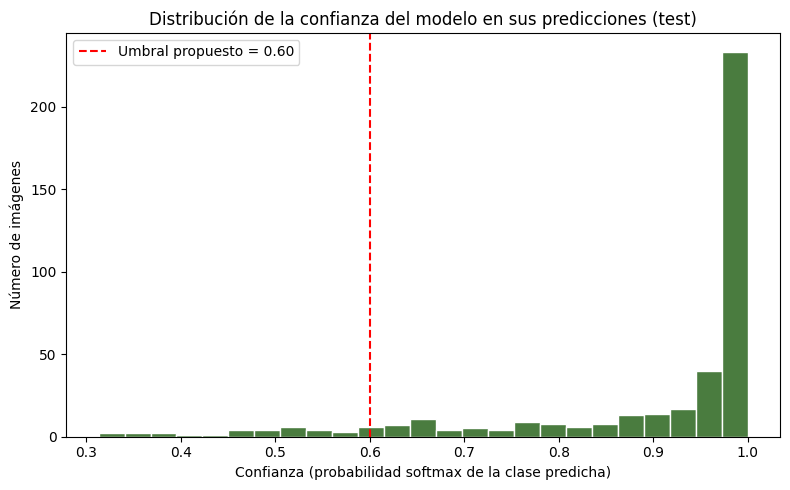

In [ ]:
plt.figure(figsize=(8, 5))
plt.hist(confianza_pred, bins=25, color="#4a7c3f", edgecolor="white")
plt.axvline(0.6, color="red", linestyle="--", label="Umbral propuesto = 0.60")
plt.title("Distribución de la confianza del modelo en sus predicciones (test)")
plt.xlabel("Confianza (probabilidad softmax de la clase predicha)")
plt.ylabel("Número de imágenes")
plt.legend()
plt.tight_layout()
plt.show()


In [ ]:
# Análisis de cobertura vs. exactitud para distintos umbrales:
# - Cobertura: % de imágenes en las que el modelo SÍ da un diagnóstico (confianza >= umbral)
# - Exactitud entre las aceptadas: qué tan confiable es el modelo cuando SÍ se anima a decidir

umbrales = np.arange(0.30, 0.96, 0.05)
resultados_umbral = []

for u in umbrales:
    mask = confianza_pred >= u
    cobertura = mask.mean()
    if mask.sum() > 0:
        exactitud_aceptadas = accuracy_score(y_true_idx[mask], y_pred_idx[mask])
    else:
        exactitud_aceptadas = np.nan
    resultados_umbral.append({
        "umbral": round(u, 2),
        "cobertura": cobertura,
        "exactitud_en_aceptadas": exactitud_aceptadas,
        "n_diagnosticos_inciertos": int((~mask).sum())
    })

df_umbral = pd.DataFrame(resultados_umbral)
df_umbral


,umbral,cobertura,exactitud_en_aceptadas,n_diagnosticos_inciertos
0,0.30,1.000000,0.874396,0
1,0.35,0.992754,0.880779,3
2,0.40,0.985507,0.884804,6
3,0.45,0.980676,0.886700,8
4,0.50,0.966184,0.892500,14
5,0.55,0.946860,0.895408,22
6,0.60,0.920290,0.910761,33
7,0.65,0.891304,0.913279,45
8,0.70,0.862319,0.927171,57
9,0.75,0.842995,0.939828,65


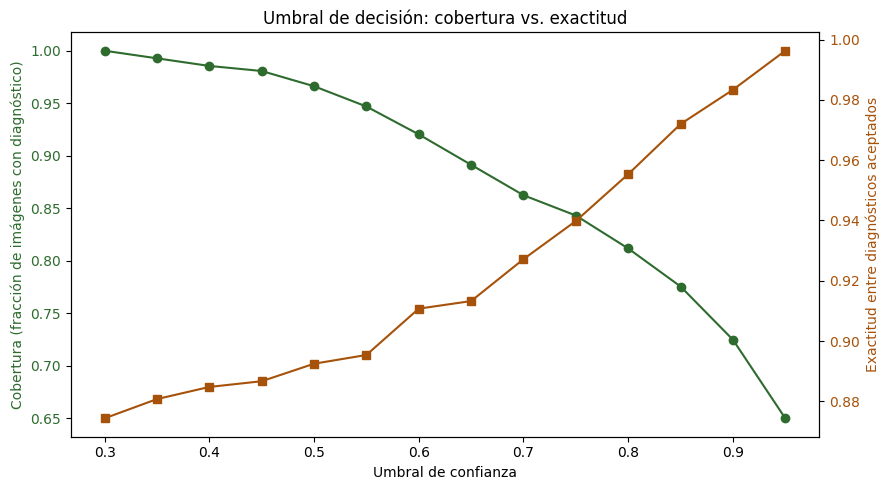

➡️  Umbral de decisión seleccionado para la app: 0.6
   (Ajustable según qué tan conservador se quiera que sea el sistema en campo)


In [ ]:
fig, ax1 = plt.subplots(figsize=(9, 5))

ax1.plot(df_umbral["umbral"], df_umbral["cobertura"], marker="o", color="#2e6b2e", label="Cobertura")
ax1.set_xlabel("Umbral de confianza")
ax1.set_ylabel("Cobertura (fracción de imágenes con diagnóstico)", color="#2e6b2e")
ax1.tick_params(axis="y", labelcolor="#2e6b2e")

ax2 = ax1.twinx()
ax2.plot(df_umbral["umbral"], df_umbral["exactitud_en_aceptadas"], marker="s", color="#a6520b", label="Exactitud en aceptadas")
ax2.set_ylabel("Exactitud entre diagnósticos aceptados", color="#a6520b")
ax2.tick_params(axis="y", labelcolor="#a6520b")

plt.title("Umbral de decisión: cobertura vs. exactitud")
fig.tight_layout()
plt.show()

UMBRAL_DECISION = 0.60
print(f"➡️  Umbral de decisión seleccionado para la app: {UMBRAL_DECISION}")
print("   (Ajustable según qué tan conservador se quiera que sea el sistema en campo)")


## 11. Prueba del modelo con imágenes

Probamos el modelo final con imágenes del conjunto de prueba, mostrando la **clase real**,
la **clase predicha**, la **confianza** y la **decisión final** aplicando el umbral definido
en la sección anterior — tal como se comportaría dentro de la app de Streamlit.


/tmp/ipykernel_2905/3832806338.py:26: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


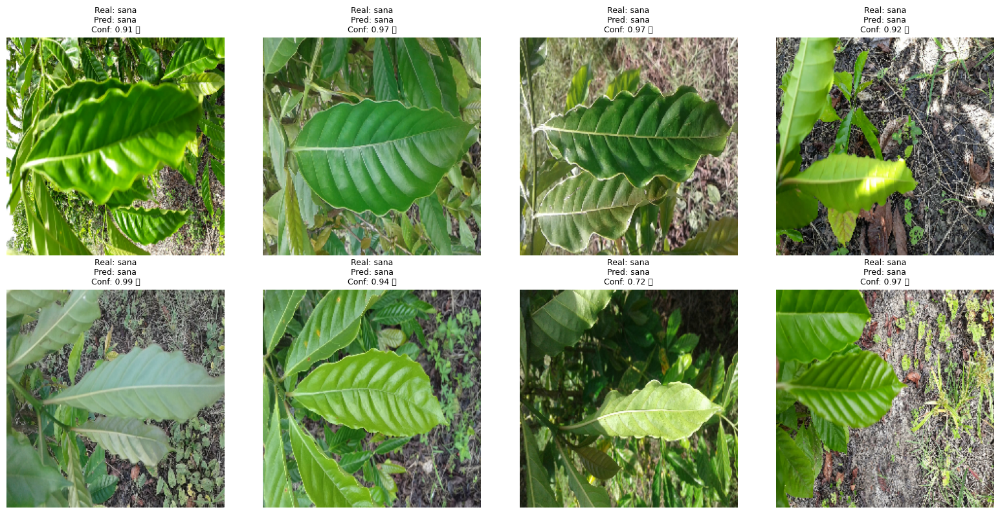

In [ ]:
def diagnosticar(imagen_array, modelo, umbral=UMBRAL_DECISION):
    '''Aplica el mismo flujo que usaría la app de Streamlit:
    preprocesa la imagen, predice y aplica el umbral de decisión.'''
    x = tf.image.resize(imagen_array, IMG_SIZE)
    x = preprocess_input(tf.expand_dims(x, 0))
    probs = modelo.predict(x, verbose=0)[0]
    idx = np.argmax(probs)
    confianza = probs[idx]
    if confianza < umbral:
        return "⚠️ Diagnóstico incierto — consultar a un técnico del IHCAFE", confianza, probs
    return CLASES[idx], confianza, probs

# Tomamos un lote de imágenes de prueba (sin preprocesar) para mostrarlas visualmente
muestras_test = []
for images, labels in test_ds_raw.take(1):
    for i in range(min(8, images.shape[0])):
        muestras_test.append((images[i].numpy(), CLASES[np.argmax(labels[i].numpy())]))

fig, axes = plt.subplots(2, 4, figsize=(16, 8))
for ax, (img, clase_real) in zip(axes.flat, muestras_test):
    pred_clase, confianza, _ = diagnosticar(img, model)
    correcto = "✅" if pred_clase == clase_real else ("❓" if "incierto" in pred_clase else "❌")
    ax.imshow(img.astype("uint8"))
    ax.set_title(f"Real: {clase_real}\nPred: {pred_clase}\nConf: {confianza:.2f} {correcto}", fontsize=9)
    ax.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
# Función lista para usarse con una imagen nueva subida por el usuario (ej. en Colab o Streamlit)
def diagnosticar_desde_archivo(ruta_imagen, modelo=model, umbral=UMBRAL_DECISION):
    img = Image.open(ruta_imagen).convert("RGB")
    img_array = np.array(img)
    pred_clase, confianza, probs = diagnosticar(img_array, modelo, umbral)

    plt.figure(figsize=(4, 4))
    plt.imshow(img_array)
    plt.title(f"{pred_clase}\nConfianza: {confianza:.2%}")
    plt.axis('off')
    plt.show()

    print("Probabilidades por clase:")
    for c, p in sorted(zip(CLASES, probs), key=lambda x: -x[1]):
        print(f"  {c:12s}: {p:.2%}")
    return pred_clase, confianza

# Ejemplo de uso (descomentar y ajustar la ruta al subir una imagen propia en Colab):
# from google.colab import files
# subida = files.upload()
# ruta = list(subida.keys())[0]
# diagnosticar_desde_archivo(ruta)


In [ ]:
print(mejor_nombre)

MobileNetV2


## 12. Exportación del modelo entrenado

Guardamos el modelo final (arquitectura + pesos) y la lista de clases, listos para
integrarse en la aplicación de **Streamlit** descrita en la sección 6 del anteproyecto.


In [ ]:
os.makedirs("/content/modelo_final", exist_ok=True)

# Guardamos el modelo en dos formatos:
#   - .keras : formato nativo recomendado por Keras 3 (mas completo y rapido de cargar)
#   - .h5    : formato HDF5 clasico, por compatibilidad (algunas versiones de Streamlit/
#              librerias externas o el codigo de despliegue pueden esperar este formato)
nombre_base = f"agrodetect_{mejor_nombre.lower()}"
MODEL_PATH_KERAS = f"/content/modelo_final/{nombre_base}.keras"
MODEL_PATH_H5 = f"/content/modelo_final/{nombre_base}.h5"

model.save(MODEL_PATH_KERAS)
model.save(MODEL_PATH_H5)

# Guardamos tambien el orden de clases, el umbral de decision, la arquitectura ganadora
# y la comparativa completa de las 3 arquitecturas evaluadas, para dejar constancia en
# el informe de por que se eligio esta arquitectura para el despliegue.
config_app = {
    "arquitectura_seleccionada": mejor_nombre,
    "clases": CLASES,
    "img_size": list(IMG_SIZE),
    "umbral_decision": UMBRAL_DECISION,
    "metricas_test": {
        "accuracy": float(test_acc),
        "precision": float(test_prec),
        "recall": float(test_rec),
    },
    "comparacion_arquitecturas": tabla_comparativa.to_dict(orient="records"),
    "fecha_entrenamiento": datetime.now().isoformat(),
}

with open("/content/modelo_final/config_app.json", "w", encoding="utf-8") as f:
    json.dump(config_app, f, ensure_ascii=False, indent=2)

print("✅ Modelo guardado en:", MODEL_PATH_KERAS)
print("✅ Modelo guardado en:", MODEL_PATH_H5)
print("✅ Configuración guardada en: /content/modelo_final/config_app.json")
print(json.dumps(config_app, ensure_ascii=False, indent=2))

✅ Modelo guardado en: /content/modelo_final/agrodetect_mobilenetv2.keras
✅ Modelo guardado en: /content/modelo_final/agrodetect_mobilenetv2.h5
✅ Configuración guardada en: /content/modelo_final/config_app.json
{
  "arquitectura_seleccionada": "MobileNetV2",
  "clases": [
    "sana",
    "roya",
    "cercospora",
    "phoma",
    "arana_roja",
    "minador"
  ],
  "img_size": [
    224,
    224
  ],
  "umbral_decision": 0.6,
  "metricas_test": {
    "accuracy": 0.8743961352657005,
    "precision": 0.8745253568473537,
    "recall": 0.8613729536622028
  },
  "comparacion_arquitecturas": [
    {
      "Arquitectura": "MobileNetV2",
      "Exactitud (test)": 0.8623188138008118,
      "Precision (test)": 0.8816120624542236,
      "Sensibilidad (test)": 0.8454106450080872,
      "F1-score (test)": 0.8631319307086003,
      "Parametros (millones)": 2.42,
      "Tiempo entrenamiento (min)": 34.1,
      "F1_norm": 1.0,
      "Tamano_norm": 1.0,
      "Puntaje_despliegue": 1.0
    },
    {
      

Saving Captura de pantalla 2026-08-01 143347.png to Captura de pantalla 2026-08-01 143347.png


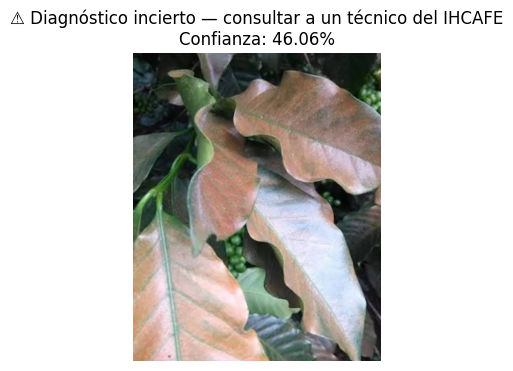

Probabilidades por clase:
  arana_roja  : 46.06%
  roya        : 35.08%
  phoma       : 10.55%
  sana        : 7.30%
  minador     : 0.61%
  cercospora  : 0.40%


In [ ]:
from google.colab import files

subida = files.upload()  # selecciona 1 o varias fotos desde tu computadora

for nombre_archivo in subida.keys():
    diagnosticar_desde_archivo(nombre_archivo)

In [ ]:
from google.colab import files

# Descarga los archivos que necesitas para tu app.py
files.download("/content/modelo_final/agrodetect_mobilenetv2.keras")
files.download("/content/modelo_final/config_app.json")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>